# Chapter 14   
***  
# Deep Computer Vision Using Convolutional Neural Networks

<table align="left">
  <td>
    <a target="_blank" href="https://colab.research.google.com/github/ageron/handson-ml2/blob/master/14_deep_computer_vision_with_cnns.ipynb"><img src="https://www.tensorflow.org/images/colab_logo_32px.png" />Run in Google Colab</a>
  </td>
</table>

# Setup

First, let's import a few common modules, ensure MatplotLib plots figures inline and prepare a function to save the figures. We also check that Python 3.5 or later is installed (although Python 2.x may work, it is deprecated so we strongly recommend you use Python 3 instead), as well as Scikit-Learn ≥0.20 and TensorFlow ≥2.0.

In [51]:
# Python ≥3.5 is required
import sys
assert sys.version_info >= (3, 5)

# Scikit-Learn ≥0.20 is required
import sklearn
assert sklearn.__version__ >= "0.20"

try:
    # %tensorflow_version only exists in Colab.
    %tensorflow_version 2.x
    IS_COLAB = True
except Exception:
    IS_COLAB = False

# TensorFlow ≥2.0 is required
import tensorflow as tf
from tensorflow import keras
assert tf.__version__ >= "2.0"

if not tf.config.list_physical_devices('GPU'):
    print("No GPU was detected. CNNs can be very slow without a GPU.")
    if IS_COLAB:
        print("Go to Runtime > Change runtime and select a GPU hardware accelerator.")

# Common imports
import numpy as np
import os

# to make this notebook's output stable across runs
np.random.seed(42)
tf.random.set_seed(42)

# To plot pretty figures
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rc('axes', labelsize=14)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)

# Where to save the figures
PROJECT_ROOT_DIR = "."
CHAPTER_ID = "cnn"
IMAGES_PATH = os.path.join(PROJECT_ROOT_DIR, "images", CHAPTER_ID)
os.makedirs(IMAGES_PATH, exist_ok=True)

def save_fig(fig_id, tight_layout=True, fig_extension="png", resolution=300):
    path = os.path.join(IMAGES_PATH, fig_id + "." + fig_extension)
    print("Saving figure", fig_id)
    if tight_layout:
        plt.tight_layout()
    plt.savefig(path, format=fig_extension, dpi=resolution)

No GPU was detected. CNNs can be very slow without a GPU.


 # CNNs   
 have managed to achieve superhuman performance on some complex visual tasks.   
  - image search services  
  - self-driving cars  
  - automatic video classification systems  
  - voice recognition  
  - natural language processing.

#### 1998 paper by Yann LeCun et al. 
that introduced the famous LeNet-5 architecture  
http://yann.lecun.com/exdb/publis/pdf/lecun-01a.pdf
***  
 - introduces two new building blocks: 
  - convolutional layers 
   - pooling layers

# Convolutional Layers  
***  
 - <font color=green>first convolutional layer</font> are not connected to every single pixel in the input image, only to pixels in their receptive fields.  
 -  each neuron in the <font color=green>second convolutional layer</font>  is connected only to neurons located within a small rectangle in the first layer.  

#### zero padding.  
 - In order for a layer to have the same height and width as the previous layer, it is com‐ mon to add zeros around the inputs 
  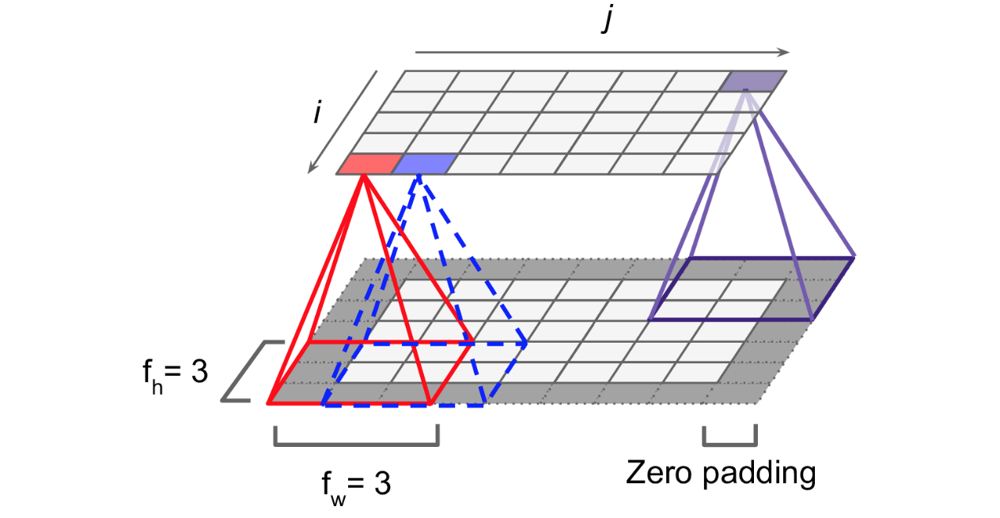

possible to connect a large input layer to a much smaller layer by spacing out the receptive fields.  
 - This dramatically reduces the model’s computational complexity.  
 -  5 × 7 input layer (plus zero padding) connected to a 3 × 4 layer, using <font color=green>3 × 3 receptive fields</font> and a <font color=green>stride of 2</font>    
 - Reducing dimensionality using a stride of 2
 
 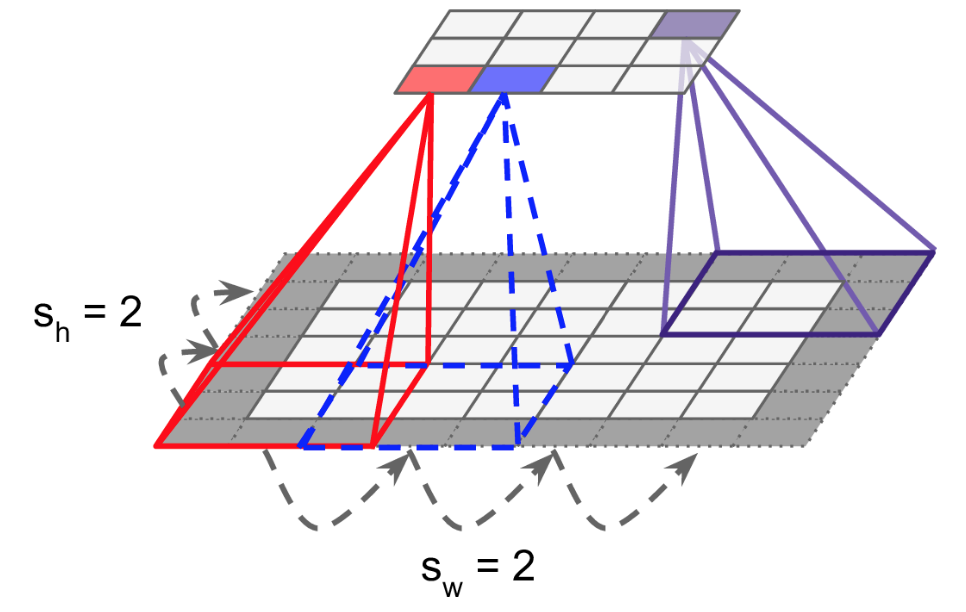

# Filters  
***  
shows two possible sets of weights, called <font color=green>filters</font> (or <font color=green>convolution kernels</font>)  
 - first one is represented as a <font color=green>black square with a vertical white line</font> in the middle  
 - second filter is a <font color=green>black square with a horizontal white</font> line in the middle.  
   
 - (<font color=green>all inputs will get multiplied by 0, except for the ones located in the central vertical line</font>)   
 -  do not have to define the filters manually:   
 instead, during training the convolutional layer will automatically learn the most useful filters for its task,   
 and the layers above will learn to combine them into more complex patterns.
   
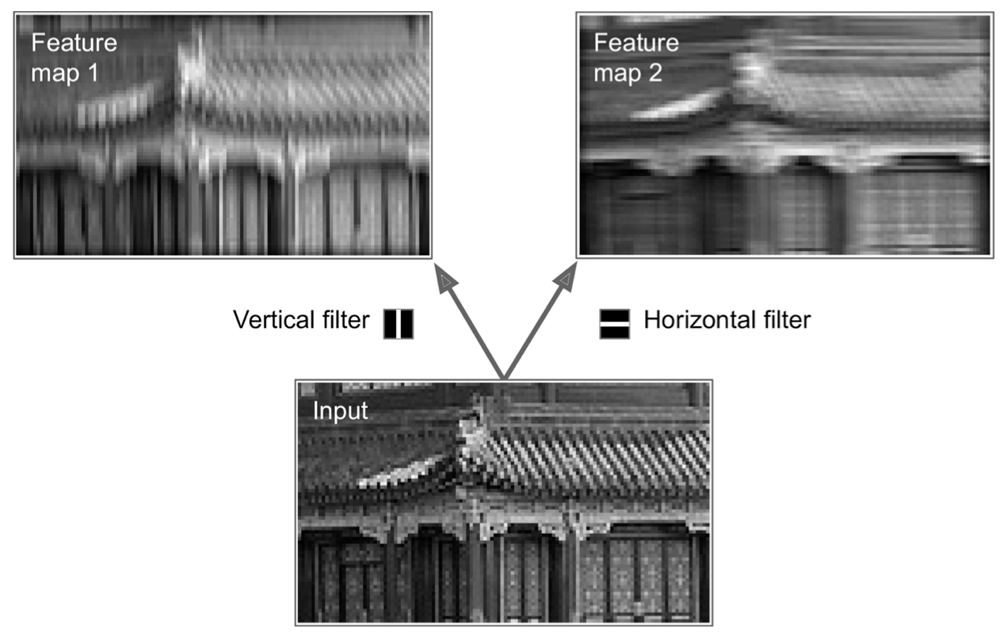

# Stacking Multiple Feature Maps  
***  
in reality a convolutional layer has multiple filters  and outputs one feature map per filter.  
 -  convolutional layer simultaneously applies multiple trainable filters to its inputs, making it capable of detecting multiple features anywhere in its inputs.  
 - Once the <font color=green>CNN</font> has learned to recognize a pattern in one location, it can <font color=green>recognize it in any other location</font>.   
 - once a <font color=green>regular DNN</font> has learned to recognize a pattern in one location, it can <font color=green>recognize it only in that particular location</font>.
  
  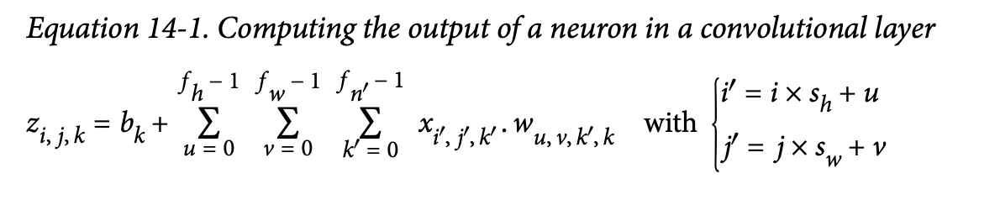

A couple utility functions to plot grayscale and RGB images:

In [2]:
def plot_image(image):
    plt.imshow(image, cmap="gray", interpolation="nearest")
    plt.axis("off")

def plot_color_image(image):
    plt.imshow(image, interpolation="nearest")
    plt.axis("off")

# What is a Convolution?  
***  
 - 3D tensor of shape <font color=green>[height, width, channels]</font> 
 - mini-batch is represented as a 4D tensor of shape <font color=green>[mini-batch size, height, width, channels]</font>  
 - weights of a convolutional layer are repre‐ sented as a 4D tensor of shape <font color=green>[fh, fw, fn′, fn]</font>  
 - bias terms of a convolutional layer are simply represented as a 1D tensor of shape <font color=green>[fn]</font>.  
 <br>  
 pip install the <font color=pink>Pillow</font> package to use <font color=pink>load_sample_image()</font>.

#### tf.nn.conv2d()  
 - <font color=pink>images</font> is the input mini-batch (a 4D tensor)  
 - <font color=pink>filters</font> is the set of filters to apply (also a 4D tensor)  
 - <font color=pink>strides</font> is equal to 1  
 - <font color=pink>padding</font> must be either "SAME" or "VALID":  
  - "SAME", the convolutional layer uses zero padding if necessary.  
  - "VALID", the convolutional layer does not use zero padding and may ignore some rows and columns at the bottom and right of the input image,  
  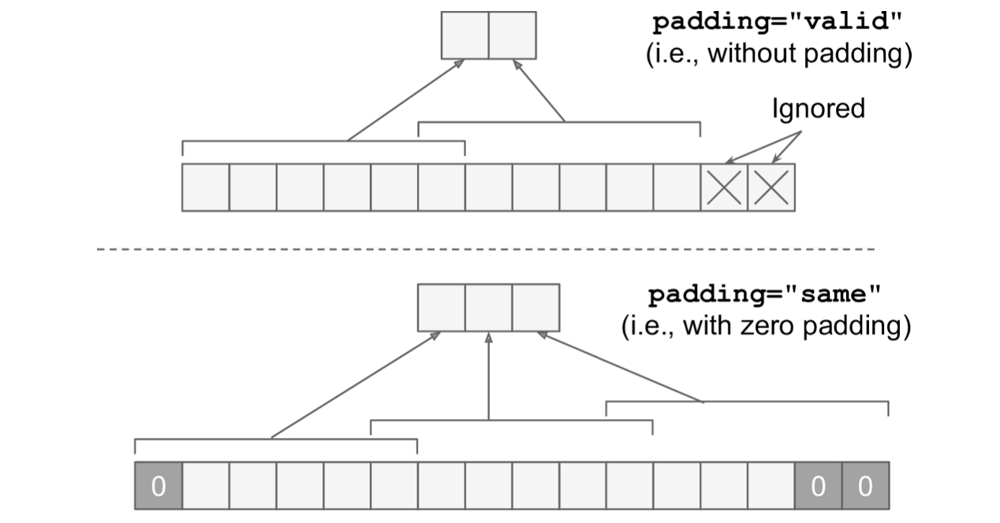

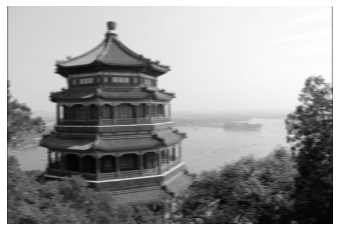

In [6]:
import numpy as np
from sklearn.datasets import load_sample_image

# Load sample images
china = load_sample_image("china.jpg") / 255    #  255로 나누어 -> floats ranging from 0 to 1.
flower = load_sample_image("flower.jpg") / 255
images = np.array([china, flower])
batch_size, height, width, channels = images.shape

# Create 2 (7x7) filters
filters = np.zeros(shape=(7, 7, channels, 2), dtype=np.float32)
filters[:, 3, :, 0] = 1  # vertical line
filters[3, :, :, 1] = 1  # horizontal line

# apply them to both images using the tf.nn.conv2d() function  
# use zero padding (padding="SAME") and a stride of 1.
outputs = tf.nn.conv2d(images, filters, strides=1, padding="SAME")

plt.imshow(outputs[0, :, :, 1], cmap="gray") # plot 1st image's 2nd feature map
plt.axis("off") # Not shown in the book
plt.show()

In [5]:
filters.shape

(7, 7, 3, 2)

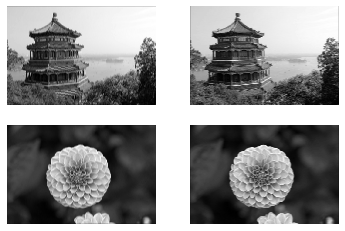

In [7]:
for image_index in (0, 1):
    for feature_map_index in (0, 1):
        plt.subplot(2, 2, image_index * 2 + feature_map_index + 1)
        plot_image(outputs[image_index, :, :, feature_map_index])

plt.show()

In [8]:
def crop(images):
    return images[150:220, 130:250]

Saving figure china_original


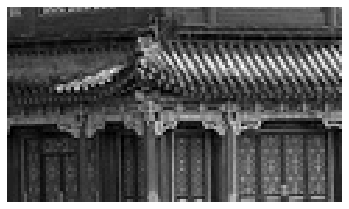

Saving figure china_vertical


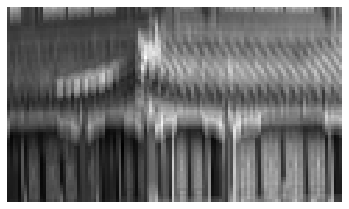

Saving figure china_horizontal


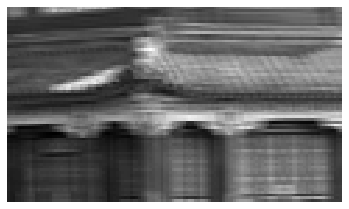

In [9]:
plot_image(crop(images[0, :, :, 0]))
save_fig("china_original", tight_layout=False)
plt.show()

for feature_map_index, filename in enumerate(["china_vertical", "china_horizontal"]):
    plot_image(crop(outputs[0, :, :, feature_map_index]))
    save_fig(filename, tight_layout=False)
    plt.show()

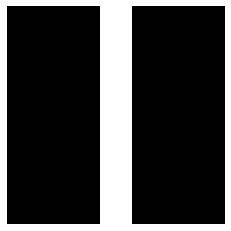

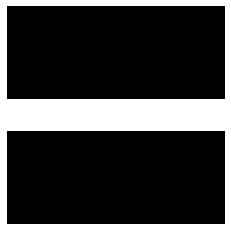

In [10]:
plot_image(filters[:, :, 0, 0])
plt.show()
plot_image(filters[:, :, 0, 1])
plt.show()

## Convolutional Layer  
***  
manually defined the filters before, but in a real CNN you would normally define filters as trainable variables so the neural net can learn which filters work best,   
 - creates a Conv2D layer with 32 filters,   
 - each 3 × 3,   
 - using a stride of 1 (both horizontally and vertically)   
 - and "same" padding,   
 - and applying the ReLU activation function to its outputs.

Using `keras.layers.Conv2D()`:

In [11]:
conv = keras.layers.Conv2D(filters=32, kernel_size=3, strides=1,
                           padding="SAME", activation="relu")

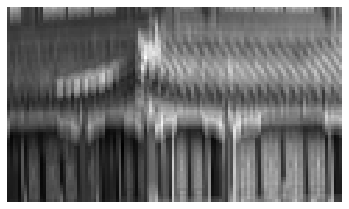

In [12]:
plot_image(crop(outputs[0, :, :, 0]))
plt.show()

## VALID vs SAME padding

In [13]:
def feature_map_size(input_size, kernel_size, strides=1, padding="SAME"):
    if padding == "SAME":
        return (input_size - 1) // strides + 1
    else:
        return (input_size - kernel_size) // strides + 1

In [14]:
def pad_before_and_padded_size(input_size, kernel_size, strides=1):
    fmap_size = feature_map_size(input_size, kernel_size, strides)
    padded_size = max((fmap_size - 1) * strides + kernel_size, input_size)
    pad_before = (padded_size - input_size) // 2
    return pad_before, padded_size

In [15]:
def manual_same_padding(images, kernel_size, strides=1):
    if kernel_size == 1:
        return images.astype(np.float32)
    batch_size, height, width, channels = images.shape
    top_pad, padded_height = pad_before_and_padded_size(height, kernel_size, strides)
    left_pad, padded_width  = pad_before_and_padded_size(width, kernel_size, strides)
    padded_shape = [batch_size, padded_height, padded_width, channels]
    padded_images = np.zeros(padded_shape, dtype=np.float32)
    padded_images[:, top_pad:height+top_pad, left_pad:width+left_pad, :] = images
    return padded_images

Using `"SAME"` padding is equivalent to padding manually using `manual_same_padding()` then using `"VALID"` padding (confusingly, `"VALID"` padding means no padding at all):

In [16]:
kernel_size = 7
strides = 2

conv_valid = keras.layers.Conv2D(filters=1, kernel_size=kernel_size, strides=strides, padding="VALID")
conv_same = keras.layers.Conv2D(filters=1, kernel_size=kernel_size, strides=strides, padding="SAME")

valid_output = conv_valid(manual_same_padding(images, kernel_size, strides))

# Need to call build() so conv_same's weights get created
conv_same.build(tf.TensorShape(images.shape))

# Copy the weights from conv_valid to conv_same
conv_same.set_weights(conv_valid.get_weights())

same_output = conv_same(images.astype(np.float32))

assert np.allclose(valid_output.numpy(), same_output.numpy())

# Memory Requirements  
***  
problem with CNNs is that the convolutional layers require a <font color=green>huge amount of RAM</font>.  
 - Example) convolutional layer with 5 × 5 filters, outputting 200 feature maps of size 150 × 100, with stride 1 and "same" padding.  
 - <font color=green>number of parameters</font> is (5 × 5 × 3 + 1) × 200 = 15,200 (the + 1 corresponds to the bias terms)  
 - if the feature maps are represented using 32-bit floats, then the convolutional layer’s output will occupy 200 × 150 × 100 × 32 = 96 million bits <font color=green>(12 MB) of RAM</font>.  
  - that’s <font color=green>just for one instance</font>—if a training batch contains 100 instances, then this layer will use up <font color=green>1.2 GB of RAM!</font>  
<br>  
 - If training crashes because of an out-of-memory error, you can try reducing the mini-batch size.  
 - you can try reducing dimensionality using a stride,   
 - Or removing a few layers.   
 - Or you can try using 16-bit floats instead of 32-bit floats.   
 - Or you could distribute the CNN across multiple devices.

# Pooling layer  
***  
second common building block of CNNs: the pooling layer.  
 -  Their goal is to subsample (i.e., shrink) the input image   
  1. in order to reduce the computational load,   
  2. reduce the memory usage,   
  3. and reduce the number of parameters (thereby limiting the risk of overfitting).  

<br>  
 - each neuron in a <font color=green>pooling layer</font> is connected to the outputs of a limited number of neurons in the previous layer, <font color=green>located within a small rectangular receptive field</font>.  
 - a  <font color=green>pooling neuron has no weights</font>; all it does is aggregate the inputs using an aggregation function such as the max or mean.   
 - Max pooling layer (2 × 2 pooling kernel, stride 2, no padding)   
 -  input values are 1, 5, 3, 2, so only the max value, 5, is propagated to the next layer.  
 - Because of the stride of 2, the output image has half the height and half the width of the input image (rounded down since we use no padding).
   
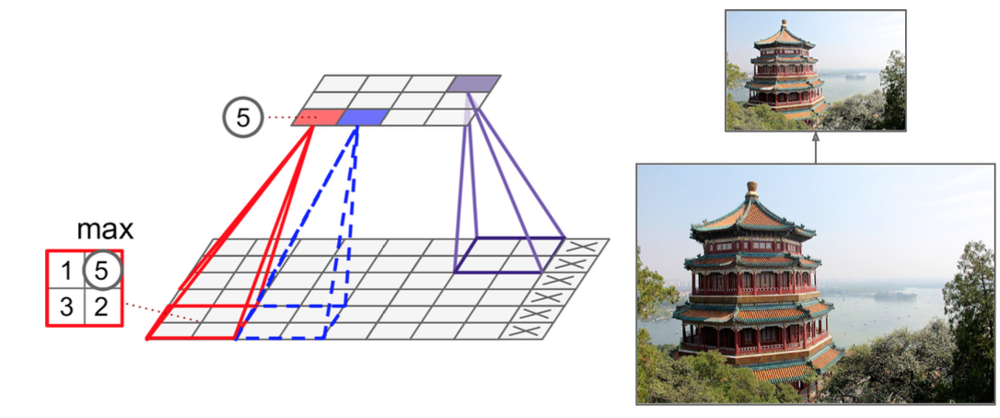

####  invariance to small translations
Other than reducing computations, memory usage, and the number of parameters, a max pooling layer  
 -  we assume that the bright pixels have a lower value than dark pixels, and we consider three images (A, B, C) going through a max pooling layer with a 2 × 2 kernel and stride 2.  
 - <font color=green>Images B and C</font> are the same as image A but, shifted by one and two pixels to the right.  
 - pooling layer for <font color=green>images A and B</font> are <font color=green>identical</font>. This is what translation invariance means.  
 - <font color=green>For image C</font>, the output is different: it is shifted one pixel to the right (but there is still <font color=green>75% invariance</font>).
 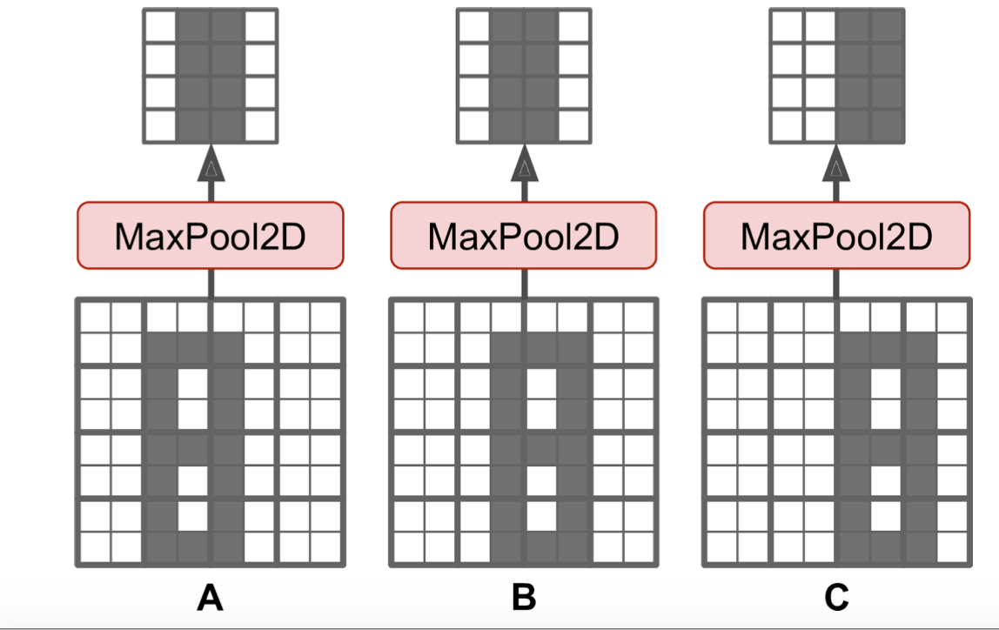  

<br>  
However, max pooling has some downsides  
 - Firstly: even with a tiny 2 × 2 kernel and a stride of 2, the output will be two times smaller in both directions (so its area will be four times smaller), simply dropping 75% of the input values.  
 - image is translated by one pixel to the right, the output should also be trans‐ lated by one pixel to the right.

## Max pooling  
## TensorFlow Implementation  
***
 
 - creates a max pooling layer using a 2 × 2 kernel.   
 - The strides default to the kernel size, so this layer will use a stride of 2 (both horizontally and vertically).   
 - By default, it uses "valid" padding (i.e., no padding at all)  
 - <font color=green>average pooling layer</font>, just use <font color=pink>AvgPool2D</font> instead of <font color=pink>MaxPool2D</font>.  
 - mostly use <font color=green>max pooling layers</font> now  
  - max pooling preserves only the strongest features, getting rid of all the meaningless ones, so the next layers get a cleaner signal to work with.  
  - max pooling offers stronger translation invariance than average pooling.  
  - requires slightly less compute.

max pooling and average pooling can be performed along the depth dimension rather than the spatial dimensions  
 - allow the CNN to learn to be invariant to various features  
  - multiple filters, each detecting a different rotation of the same pattern (such as hand-written digits  
  -<font color=green> depthwise max pooling</font> layer would ensure that the output is the same regardless of the rotation.   
  - The CNN could similarly learn to be invariant to anything else: <font color=green>thickness, brightness, skew, color</font>, and so on.   
  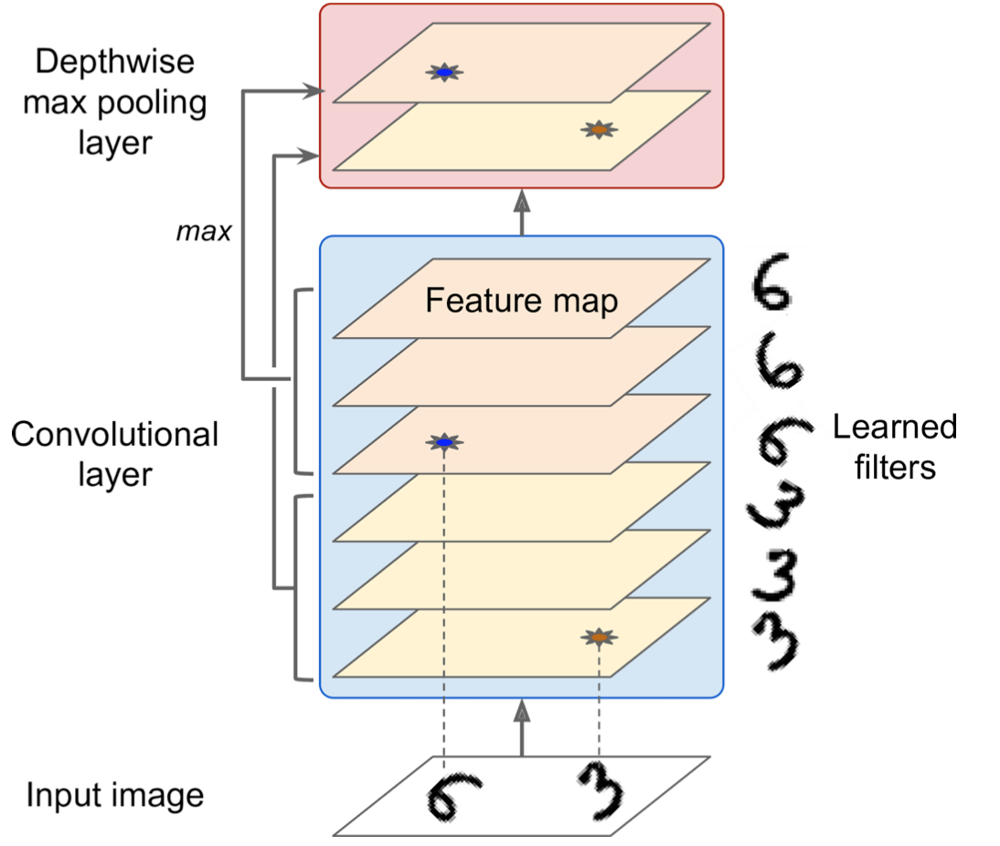depthwise 

In [17]:
max_pool = keras.layers.MaxPool2D(pool_size=2)

In [18]:
cropped_images = np.array([crop(image) for image in images], dtype=np.float32)
output = max_pool(cropped_images)

Saving figure china_max_pooling


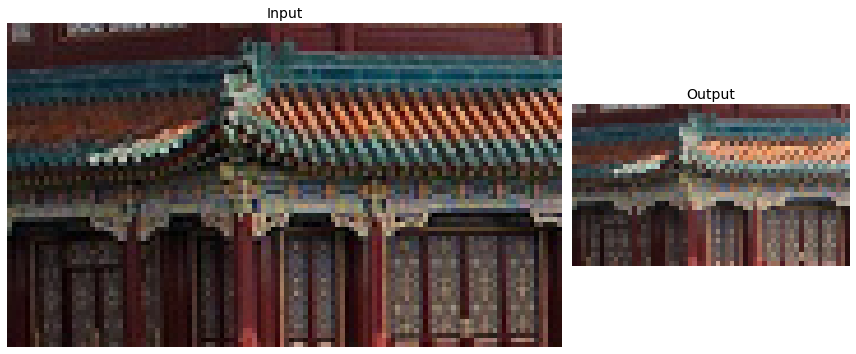

In [19]:
fig = plt.figure(figsize=(12, 8))
gs = mpl.gridspec.GridSpec(nrows=1, ncols=2, width_ratios=[2, 1])

ax1 = fig.add_subplot(gs[0, 0])
ax1.set_title("Input", fontsize=14)
ax1.imshow(cropped_images[0])  # plot the 1st image
ax1.axis("off")
ax2 = fig.add_subplot(gs[0, 1])
ax2.set_title("Output", fontsize=14)
ax2.imshow(output[0])  # plot the output for the 1st image
ax2.axis("off")
save_fig("china_max_pooling")
plt.show()

## Depth-wise pooling  
Keras does not include a depthwise max pooling layer,  
TensorFlow’s low-level Deep Learning API does:   
just use the <font color=pink>tf.nn.max_pool()</font>    
 - specify the kernel size and strides as 4-tuples (i.e., tuples of size 4)  
 - first three values of each should be 1 (batch, height, and width dimensions should be 1)  
 - last value should be whatever kernel size and stride you want along the depth dimension   
 (this must be a divisor of the input depth; )  
 
<br>  
If you want to include this as a layer in your Keras models,   
 - wrap it in a `Lambda layer`   
 - (or create a `custom Keras layer`): 

In [20]:
class DepthMaxPool(keras.layers.Layer):
    def __init__(self, pool_size, strides=None, padding="VALID", **kwargs):
        super().__init__(**kwargs)
        if strides is None:
            strides = pool_size
        self.pool_size = pool_size
        self.strides = strides
        self.padding = padding
    def call(self, inputs):
        return tf.nn.max_pool(inputs,
                              ksize=(1, 1, 1, self.pool_size),
                              strides=(1, 1, 1, self.pool_size),
                              padding=self.padding)

In [21]:
depth_pool = DepthMaxPool(3)
with tf.device("/cpu:0"): # there is no GPU-kernel yet
    depth_output = depth_pool(cropped_images)
depth_output.shape

TensorShape([2, 70, 120, 1])

Or just use a `Lambda` layer:

In [22]:
depth_pool = keras.layers.Lambda(lambda X: tf.nn.max_pool(
    X, ksize=(1, 1, 1, 3), strides=(1, 1, 1, 3), padding="VALID"))
with tf.device("/cpu:0"): # there is no GPU-kernel yet
    depth_output = depth_pool(cropped_images)
depth_output.shape

TensorShape([2, 70, 120, 1])

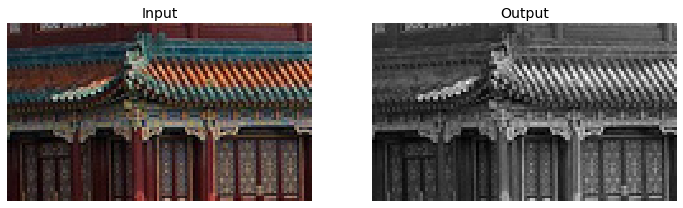

In [23]:
plt.figure(figsize=(12, 8))
plt.subplot(1, 2, 1)
plt.title("Input", fontsize=14)
plot_color_image(cropped_images[0])  # plot the 1st image
plt.subplot(1, 2, 2)
plt.title("Output", fontsize=14)
plot_image(depth_output[0, ..., 0])  # plot the output for the 1st image
plt.axis("off")
plt.show()

## Average pooling

In [24]:
avg_pool = keras.layers.AvgPool2D(pool_size=2)

In [25]:
output_avg = avg_pool(cropped_images)

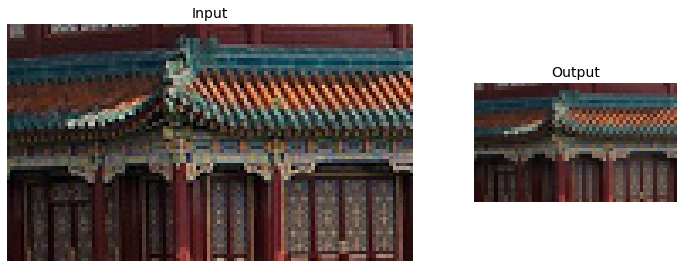

In [26]:
fig = plt.figure(figsize=(12, 8))
gs = mpl.gridspec.GridSpec(nrows=1, ncols=2, width_ratios=[2, 1])

ax1 = fig.add_subplot(gs[0, 0])
ax1.set_title("Input", fontsize=14)
ax1.imshow(cropped_images[0])  # plot the 1st image
ax1.axis("off")
ax2 = fig.add_subplot(gs[0, 1])
ax2.set_title("Output", fontsize=14)
ax2.imshow(output_avg[0])  # plot the output for the 1st image
ax2.axis("off")
plt.show()

## Global Average Pooling  
 - all it does is compute the mean of each entire feature map (it’s like an average pooling layer using a pooling kernel with the same spatial dimensions as the inputs)  
 - it just outputs a single number per feature map and per instance.  
 - (most of the information in the feature map is lost), it can be `useful as the output layer`  
 - <font color=pink>keras.layers.GlobalAvgPool2D</font> class

In [27]:
global_avg_pool = keras.layers.GlobalAvgPool2D()
global_avg_pool(cropped_images)

<tf.Tensor: shape=(2, 3), dtype=float32, numpy=
array([[0.2788801 , 0.22507527, 0.20967631],
       [0.51287866, 0.4595188 , 0.3342377 ]], dtype=float32)>

In [28]:
output_global_avg2 = keras.layers.Lambda(lambda X: tf.reduce_mean(X, axis=[1, 2]))
output_global_avg2(cropped_images)

<tf.Tensor: shape=(2, 3), dtype=float32, numpy=
array([[0.2788801 , 0.22507527, 0.20967631],
       [0.51287866, 0.4595188 , 0.3342377 ]], dtype=float32)>

# CNN Architectures  
***  
 - few `convolutional layers` (each one generally followed by a ReLU layer), then a `pooling layer`, then another few `convolutional layers` (+ReLU), then another `pooling layer`, and so on.   
 - image gets smaller and smaller  
 - also typically gets deeper and deeper (i.e., with more feature maps). thanks to the convolutional layers.  
 - Top of the stack, a regular feedforward neural network is added fully connected layers (+ReLUs)  
 - final layer outputs the prediction (e.g., a softmax layer that outputs estimated class probabilities)  
 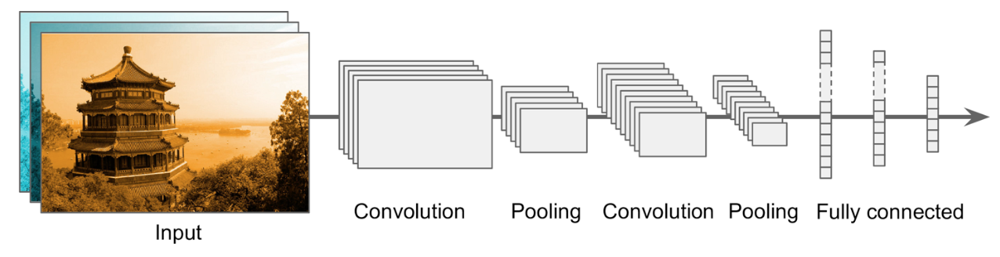  
   
#### common mistake is to use convolution kernels that are too large  
 - instead of using a `convolutional layer with a 5 × 5 kernel`, `stack two layers with 3 × 3 kernels`:   
  - it will use fewer parameters and require fewer computations, and it will usually perform better.  
 - One exception is for the `first convolutional layer`  
  - can typically have a large kernel  
  - will reduce the spatial dimension of the image without losing too much information

# Tackling Fashion MNIST With a CNN

In [29]:
(X_train_full, y_train_full), (X_test, y_test) = keras.datasets.fashion_mnist.load_data()
X_train, X_valid = X_train_full[:-5000], X_train_full[-5000:]
y_train, y_valid = y_train_full[:-5000], y_train_full[-5000:]

X_mean = X_train.mean(axis=0, keepdims=True)
X_std = X_train.std(axis=0, keepdims=True) + 1e-7
X_train = (X_train - X_mean) / X_std
X_valid = (X_valid - X_mean) / X_std
X_test = (X_test - X_mean) / X_std

X_train = X_train[..., np.newaxis]
X_valid = X_valid[..., np.newaxis]
X_test = X_test[..., np.newaxis]

In [30]:
from functools import partial

DefaultConv2D = partial(keras.layers.Conv2D,
                        kernel_size=3, activation='relu', padding="SAME")

model = keras.models.Sequential([
    # first layer uses 64 fairly large filters (7 × 7) but no stride(input images not very large)
    # input_shape=[28, 28, 1] -> 28 × 28 pixels, with a single color channel (i.e., grayscale)
    DefaultConv2D(filters=64, kernel_size=7, input_shape=[28, 28, 1]),
    
    # max pooling layer pool size of 2, so it divides each spatial dimension by a factor of 2.
    keras.layers.MaxPooling2D(pool_size=2),
    
    # repeat the same structure twice: 2 convolutional layers + 1 max pooling layer.
    # larger images -> repeat this structure several more times
    # number of filters grows as we climb up the CNN (it is initially 64, then 128, then 256)
    # common practice to double the number of filters after each pooling layer
    DefaultConv2D(filters=128),
    DefaultConv2D(filters=128),
    keras.layers.MaxPooling2D(pool_size=2),
    DefaultConv2D(filters=256),
    DefaultConv2D(filters=256),
    keras.layers.MaxPooling2D(pool_size=2),
    
    # Next is the fully connected network -> two hidden dense layers + dense output layer  
    # must flatten inputs, since a dense network expects a 1D array of features for each instance.
    # add two dropout layers, with a dropout rate of 50% each, to reduce overfitting.
    keras.layers.Flatten(),
    keras.layers.Dense(units=128, activation='relu'),
    keras.layers.Dropout(0.5),
    keras.layers.Dense(units=64, activation='relu'),
    keras.layers.Dropout(0.5),
    keras.layers.Dense(units=10, activation='softmax'),
])

In [31]:
model.compile(loss="sparse_categorical_crossentropy", optimizer="nadam", metrics=["accuracy"])
history = model.fit(X_train, y_train, epochs=10, validation_data=(X_valid, y_valid))
score = model.evaluate(X_test, y_test)
X_new = X_test[:10] # pretend we have new images
y_pred = model.predict(X_new)

Epoch 1/10
1719/1719 [==============================] - 554s 322ms/step - loss: 0.7103 - accuracy: 0.7508 - val_loss: 0.3777 - val_accuracy: 0.8626
Epoch 2/10
1719/1719 [==============================] - 498s 290ms/step - loss: 0.4207 - accuracy: 0.8574 - val_loss: 0.3437 - val_accuracy: 0.8800
Epoch 3/10
1719/1719 [==============================] - 510s 297ms/step - loss: 0.3616 - accuracy: 0.8777 - val_loss: 0.3041 - val_accuracy: 0.8894
Epoch 4/10
1719/1719 [==============================] - 552s 321ms/step - loss: 0.3320 - accuracy: 0.8875 - val_loss: 0.2956 - val_accuracy: 0.8928
Epoch 5/10
1719/1719 [==============================] - 511s 297ms/step - loss: 0.3068 - accuracy: 0.8949 - val_loss: 0.3277 - val_accuracy: 0.8870
Epoch 6/10
1719/1719 [==============================] - 511s 297ms/step - loss: 0.2970 - accuracy: 0.9002 - val_loss: 0.2747 - val_accuracy: 0.9000
Epoch 7/10
1719/1719 [==============================] - 498s 289ms/step - loss: 0.2772 - accuracy: 0.9065 - val_

This CNN reaches over 92% accuracy on the test set?????? only 89.89

In [32]:
X_new

array([[[[-0.00850526],
         [-0.02275603],
         [-0.0389675 ],
         ...,
         [-0.05000659],
         [-0.03273251],
         [-0.01376187]],

        [[-0.01286144],
         [-0.01833704],
         [-0.03369924],
         ...,
         [-0.08932867],
         [-0.05848995],
         [-0.02901122]],

        [[-0.01577607],
         [-0.0257731 ],
         [-0.04552544],
         ...,
         [-0.12880774],
         [-0.08673387],
         [-0.05075351]],

        ...,

        [[-0.10002104],
         [-0.16164459],
         [-0.23368801],
         ...,
         [-0.29681795],
         [-0.20850412],
         [-0.11106573]],

        [[-0.05651808],
         [-0.10484704],
         [-0.17791999],
         ...,
         [-0.24209789],
         [-0.15473034],
         [-0.07551387]],

        [[-0.02516203],
         [-0.04947936],
         [-0.10253125],
         ...,
         [-0.15669703],
         [-0.0895455 ],
         [-0.03384112]]],


       [[[-0.00850526],


## LeNet-5  
***
1998  http://yann.lecun.com/exdb/publis/pdf/lecun-01a.pdf
***  
 - widely used for handwritten digit recognition (MNIST)  
 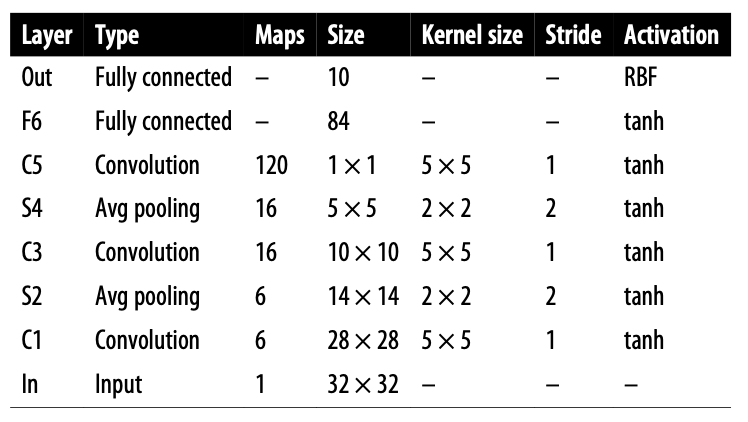  
 
 - MNIST images are 28 × 28 pixels, but they are <font color=green>zero-padded</font> to 32 × 32 pixels and  <font color=green>normalized</font>.  
 - The rest of the network does not use any padding.  
 - average pooling layers are slightly more complex than usual:  
  - each neuron computes the mean of its inputs,   
  - then multiplies the result by a learnable coefficient (one per map)   
  - and adds a learnable bias term (again, one per map),   
  - then finally applies the activation function.  
 - Most neurons in C3 maps are connected to neurons in only three or four S2 maps (instead of all six S2 maps)  `See table 1 (page 8)`  
 - The <font color=green>output layer</font> is a bit special  
  - instead of computing the `matrix multiplication` of the inputs and the weight vector, each neuron outputs the `square of the Euclidian distance` between its input vector and its weight vector.  
 - cross-entropy cost function is now preferred.  
  - penalizes bad predictions much more  
  - producing larger gradients and converging faster  
http://yann.lecun.com/exdb/lenet/index.html

## AlexNet  
***
2012  https://papers.nips.cc/paper/4824-imagenet-classification-with-deep-convolutional-neural-networks
***  
achieved a top-five error rate of 17%, second best achieved only 26%   
 - similar to LeNet-5, only much larger and deeper  
 - <font color=green>first to stack convolutional layers directly on top</font> of one another, instead of stacking a pooling layer on top of each convolutional layer  
 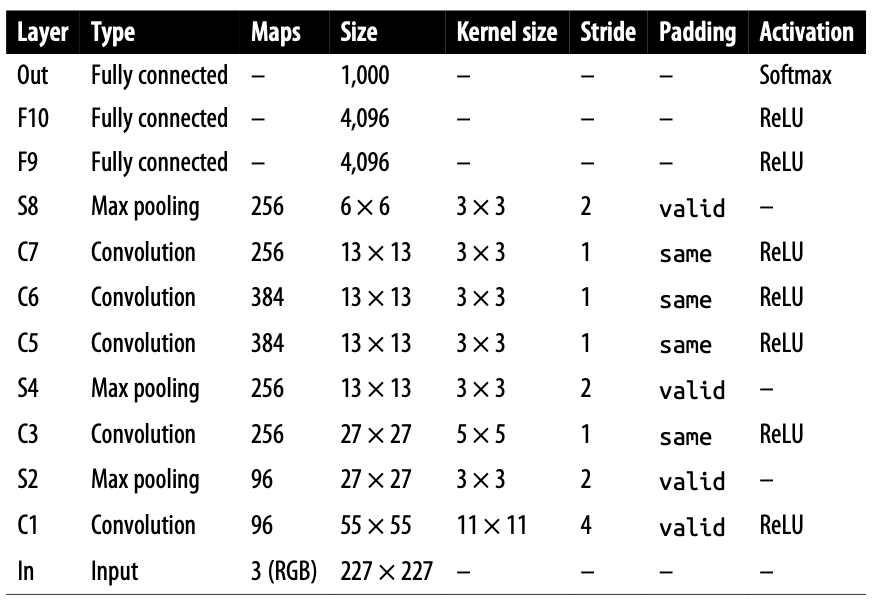  
   
 - To reduce overfitting, the authors used two regularization techniques.  
  - First, they applied `dropout with a 50% dropout rate` during training to the outputs of layers F9 and F10.  
  - Second they performed `data augmentation` by randomly shifting the training images by various offsets, flipping them horizontally, and changing the lighting conditions.  
 - AlexNet also uses a competitive normalization step immediately after the ReLU step of layers C1 and C3, called  <font color=green>local response normalization (LRN)</font>  
  - most strongly activated neurons inhibit other neurons located at the same position in neighboring feature maps.    
 
 -  k, α, β, and r are hyperparameters. `k` is called the bias, and `r` is called the depth
radius
    
 - AlexNet, hyperparameters: `r = 2, α = 0.00002, β = 0.75, and k = 1`. with <font color=pink>tf.nn.local_response_normalization()</font>   
 
 ***  
 ZF Net 2013 https://arxiv.org/abs/1311.2901  
 AlexNet with a few tweaked hyperparameters (number of feature maps, kernel size, stride, etc.).



#### Data Augmentation  
 - artificially increases the size of the training set by generating many realistic variants of each training instance.  
 - slightly shift, rotate, and resize every picture in the training set by various amounts and add the resulting pictures to the training set.  
 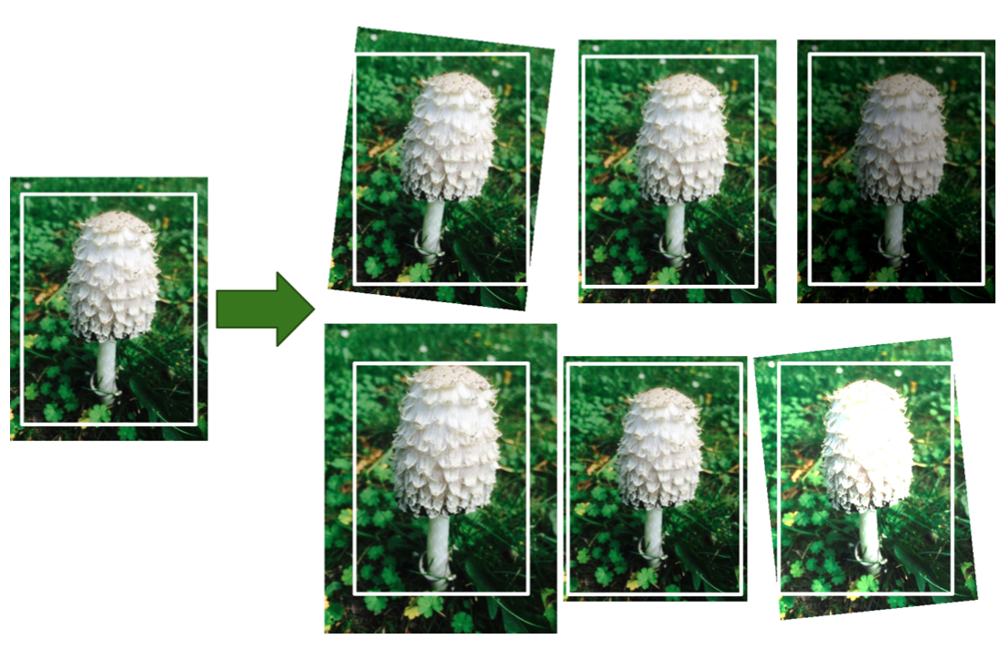

## GoogLeNet  
***
2014  https://www.cv-foundation.org/openaccess/content_cvpr_2015/html/Szegedy_Going_Deeper_With_2015_CVPR_paper.html
***   
 - Top-five error rate below 7%  
 - much deeper than previous CNNs  
 - Used subnetworks called `inception modules`  
  - allow `GoogLeNet` to use parameters much more efficiently than previous architectures  
  - 10 times fewer parameters than AlexNet (roughly 6 million instead of 60 million)  

#### Inception module  
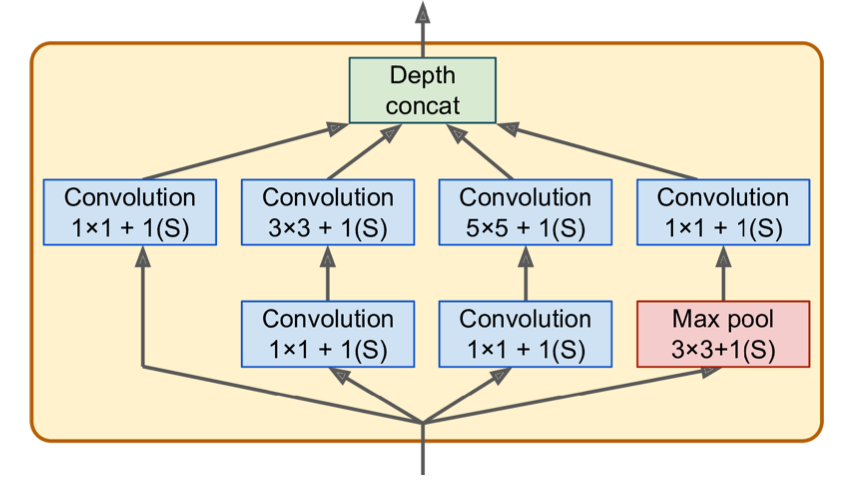  
    
 - `3 × 3 + 1(S)` means that the layer uses a `3 × 3 kernel`, `stride 1`, and `"same" padding`  
 - input signal is first copied and fed to four different layers  
 All convolutional layers use the `ReLU activation function`.  
 - second set of convolutional layers uses different kernel sizes (1 × 1, 3 × 3, and 5 × 5)  
 - every single layer uses a `stride of 1` and `"same" padding` (even the max pooling layer)  
  - so their outputs all have the same height and width as their inputs  
  
 - concatenate all the outputs along the depth dimension in the final `depth concatenation layer`  
  - implemented in TF using the <font color=pink>tf.concat()</font> operation, with <font color=pink>axis=3</font> (the axis is the depth).  

####  why inception modules have convolutional layers with 1 × 1 ker‐nels?  
 - Although they cannot capture spatial patterns, they can capture patterns along the `depth dimension`.  
 - They serve as `bottleneck layers` meaning they reduce dimensionality.  
 speeding up training and improving generalization.  
 - Each pair of convolutional layers (`[1 × 1, 3 × 3]` and `[1 × 1, 5 × 5]`) acts like a single powerful convolutional layer  
   
In short, you can think of the whole inception module as a convolutional layer on steroids, able to output feature maps that capture complex patterns at various scales.
 

#### GoogLeNet architecture  
 - `GoogLeNet` is actually one tall stack, including nine `inception modules`
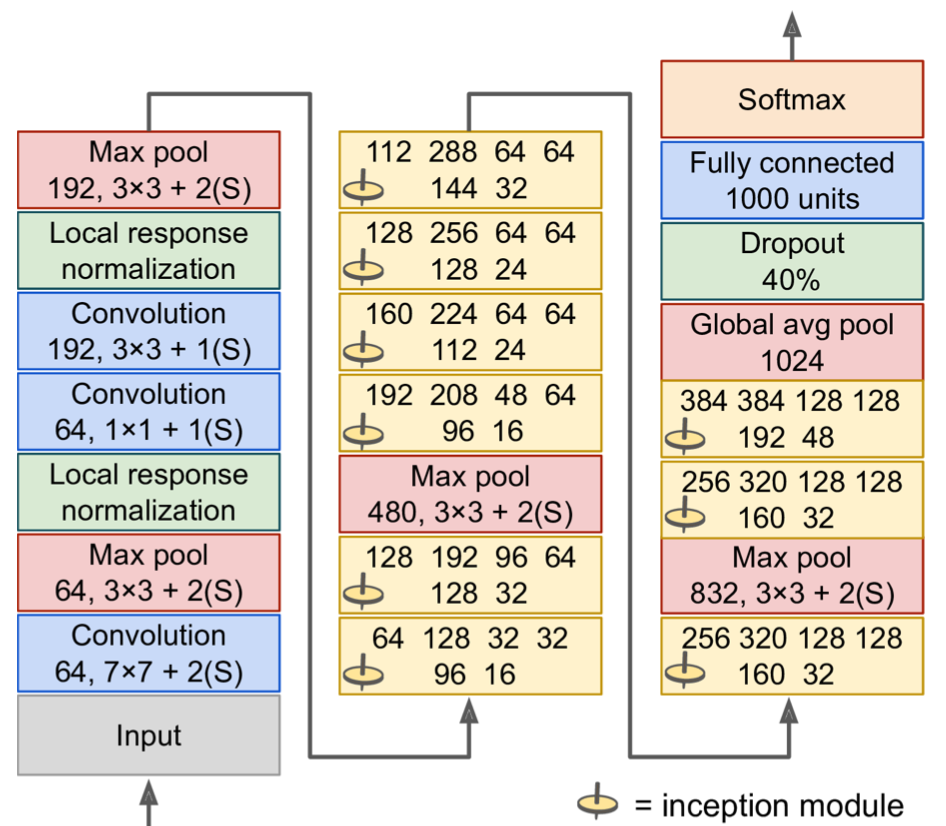  
  
 - `first two layers` divide the image’s height and width by 4  
 - `local response normalization layer` ensures that the previous layers learn a wide variety of features.  
 - `Two convolutional layers` follow, acts like a bottleneck layer.  
 -  Again, a `local response normalization layer` ensures that the previous layers capture a wide variety of patterns  
 - `max pooling layer` reduces the image height and width by 2 -> to speed up computations.  
 - tall stack of `nine inception modules` -> reduce dimensionality and speed up the net.  
 - `global average pooling layer` outputs the mean of each feature map:  
  - this drops any remaining spatial information, which is fine because there was not much spatial information left at that point.  
 - `last layers`  
  - dropout for regularization,   
  - then a fully connected layer with 1,000 units (since there are 1,000 classes)  
  - and a softmax activation function to output estimated class probabilities.  
 - also included `two auxiliary classifiers` plugged on top of the third and sixth inception modules.  
  - They were both composed of one `average pooling layer`, one `convolutional layer`, two `fully connected layers`, and a `softmax activation layer`

# VGGNet. 
***  
2014  https://arxiv.org/abs/1409.1556  
***  
 - With 2 or 3 convolutional layers and a pooling layer,   
 - then again 2 or 3 convolutional layers and a pooling layer, and so on   
 - total of just 16 or 19 convolutional layers, depending on the VGG variant), plus a final dense network with 2 hidden layers and the output layer.

# ResNet-34    
***
2014  https://arxiv.org/abs/1512.03385    
***  
 - error rate under 3.6%  
 - extremely deep CNN composed of `152 layers`(other variants had 34, 50, and 101 layers)  
 - models are getting deeper and deeper, with fewer and fewer parameters.  
 - key to being able to train such a deep network is to use `skip connections`  
   
#### residual learning  
 - If you add the input x to the output of the network (i.e., you add a skip connection), then the network will be forced to model $f(x) = h(x) – x$ rather than $h(x)$    
 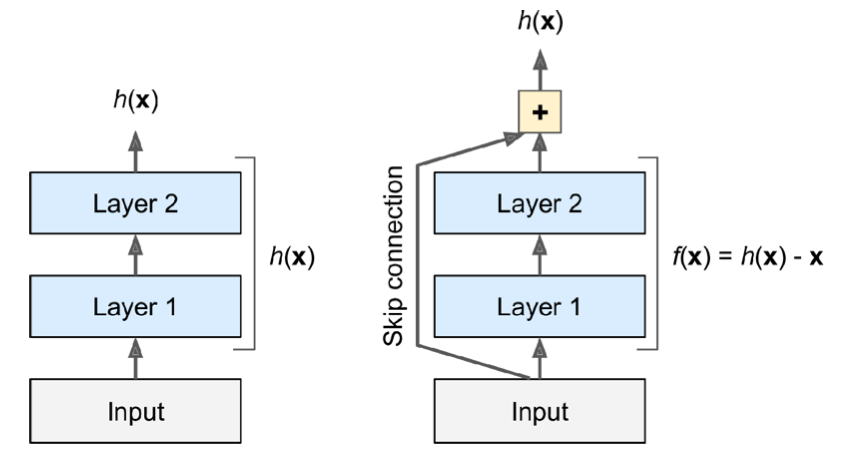  
   
- If you add a skip connection, the resulting network just outputs a copy of its inputs;  
 - it initially models the identity function.  
 - target function is fairly close to the identity function -> speed up training considerably.  
 - if you add many skip connections, the network can start making progress even if several layers have not started learning yet.  

- deep residual network can be seen as a stack of `residual units (RUs)`, where each residual unit is a `small neural network with a skip connection`.   
- Regular deep neural network (left) and deep residual network (right)
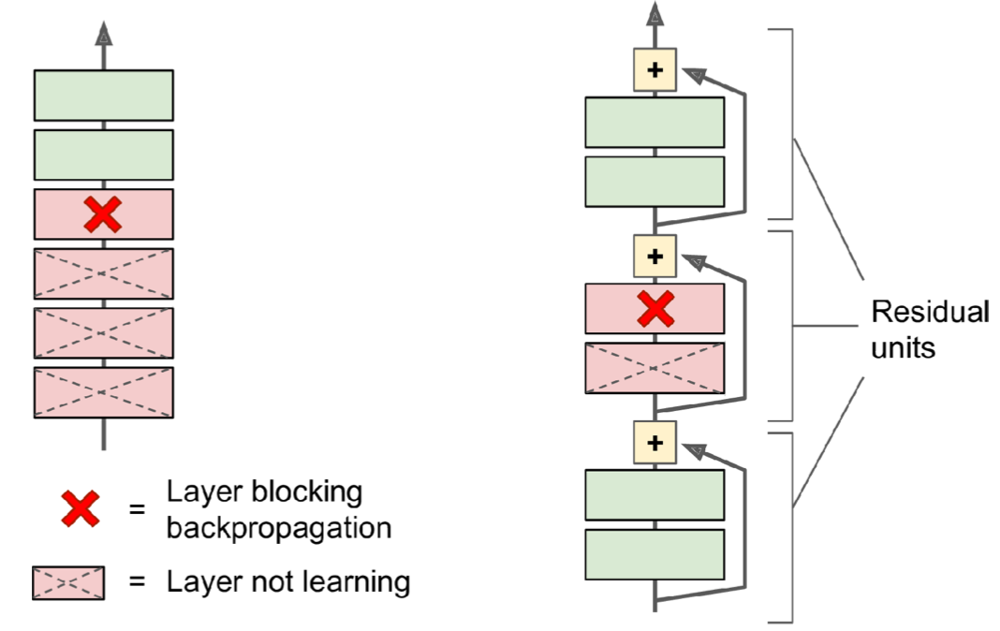 

starts and ends exactly like GoogLeNet (except without a dropout layer), in between is just a very deep stack of `simple residual units`.  
 - Each residual unit is composed of two `convolutional layers` (and no pooling layer!), with `Batch Normalization (BN)` and `ReLU activation`, using 3 × 3 kernels and preserving spatial dimensions (stride 1, "same" padding).  
 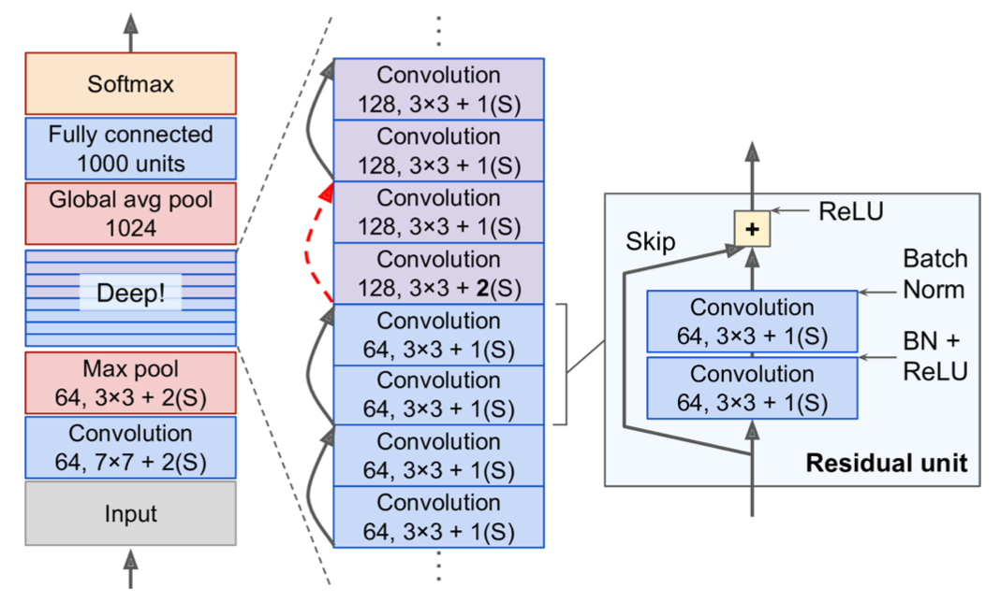  
   
- number of feature maps is doubled every few residual units,  
- at the same time as their height and width are halved (using a convolutional layer with stride 2).

#### ResNet-34     
***
is the ResNet with 34 layers  
 - containing 3 residual units that output 64 feature maps, 4 RUs with 128 maps, 6 RUs with 256 maps, and 3 RUs with 512 maps.  

#### ResNet-154. 
 - Instead of two 3 × 3 convolutional layers with, say, 256 feature map  
 - use three convolutional layers: first a 1 × 1 convolutional layer with just 64 feature maps (4 times less) -> acts as a bottleneck layer  
 - then a 3 × 3 layer with 64 feature maps  
 - finally another 1 × 1 convolutional layer with 256 feature maps (4 times 64) -> restores the original depth.  
 - contains `3 such RUs` that output 256 maps, then `8 RUs` with 512 maps, a whopping `36 RUs` with 1,024 maps, and finally `3 RUs` with 2,048 maps.

#### inputs cannot be added directly to the outputs of the residual unit because they don’t have the same shape   
 -  To solve this problem, the inputs are passed through a 1 × 1 convolutional layer with stride 2 and the right number of output feature maps.  
 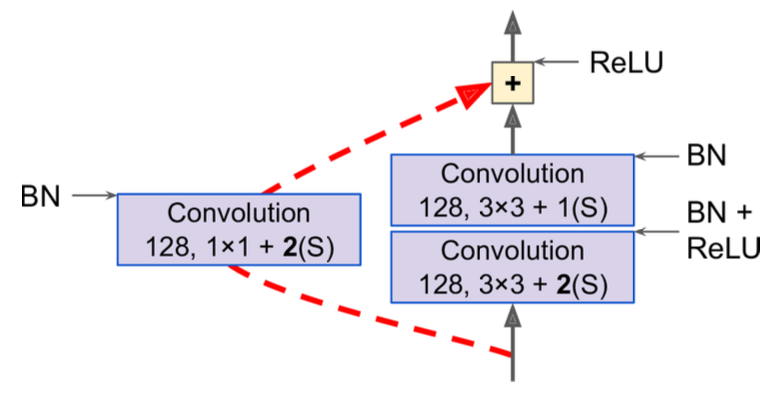

# Implementing a ResNet-34 CNN Using Keras  
***

In [34]:
DefaultConv2D = partial(keras.layers.Conv2D, kernel_size=3, strides=1,
                        padding="SAME", use_bias=False)

class ResidualUnit(keras.layers.Layer):
    def __init__(self, filters, strides=1, activation="relu", **kwargs):
        super().__init__(**kwargs)
        self.activation = keras.activations.get(activation)
        self.main_layers = [
            DefaultConv2D(filters, strides=strides),
            keras.layers.BatchNormalization(),
            self.activation,
            DefaultConv2D(filters),
            keras.layers.BatchNormalization()]
        self.skip_layers = []
        if strides > 1:
            self.skip_layers = [
                DefaultConv2D(filters, kernel_size=1, strides=strides),
                keras.layers.BatchNormalization()]

    def call(self, inputs):
        Z = inputs
        for layer in self.main_layers:
            Z = layer(Z)
        skip_Z = inputs
        for layer in self.skip_layers:
            skip_Z = layer(skip_Z)
        return self.activation(Z + skip_Z)

In [35]:
model = keras.models.Sequential()
model.add(DefaultConv2D(64, kernel_size=7, strides=2,
                        input_shape=[224, 224, 3]))
model.add(keras.layers.BatchNormalization())
model.add(keras.layers.Activation("relu"))
model.add(keras.layers.MaxPool2D(pool_size=3, strides=2, padding="SAME"))
prev_filters = 64
# first 3 RUs have 64 filters, then the next 4 RUs have 128 filters, and so on
for filters in [64] * 3 + [128] * 4 + [256] * 6 + [512] * 3:
    strides = 1 if filters == prev_filters else 2
    model.add(ResidualUnit(filters, strides=strides))
    prev_filters = filters
model.add(keras.layers.GlobalAvgPool2D())
model.add(keras.layers.Flatten())
model.add(keras.layers.Dense(10, activation="softmax"))

In [36]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_8 (Conv2D)            (None, 112, 112, 64)      9408      
_________________________________________________________________
batch_normalization (BatchNo (None, 112, 112, 64)      256       
_________________________________________________________________
activation (Activation)      (None, 112, 112, 64)      0         
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 56, 56, 64)        0         
_________________________________________________________________
residual_unit (ResidualUnit) (None, 56, 56, 64)        74240     
_________________________________________________________________
residual_unit_1 (ResidualUni (None, 56, 56, 64)        74240     
_________________________________________________________________
residual_unit_2 (ResidualUni (None, 56, 56, 64)       

# Xception  
***  
2016 https://arxiv.org/abs/1610.02357  
***  
`Extreme Inception`  
 - replaces the `inception modules` with a `depthwise separable convolution layer` (or `separable convolution layer` for short)  
 - composed of two parts  
  - applies a single spatial filter for each input feature map  
  - second part looks exclusively for cross-channel patterns—it is just a regular convolutional layer with 1 × 1 filters.  
  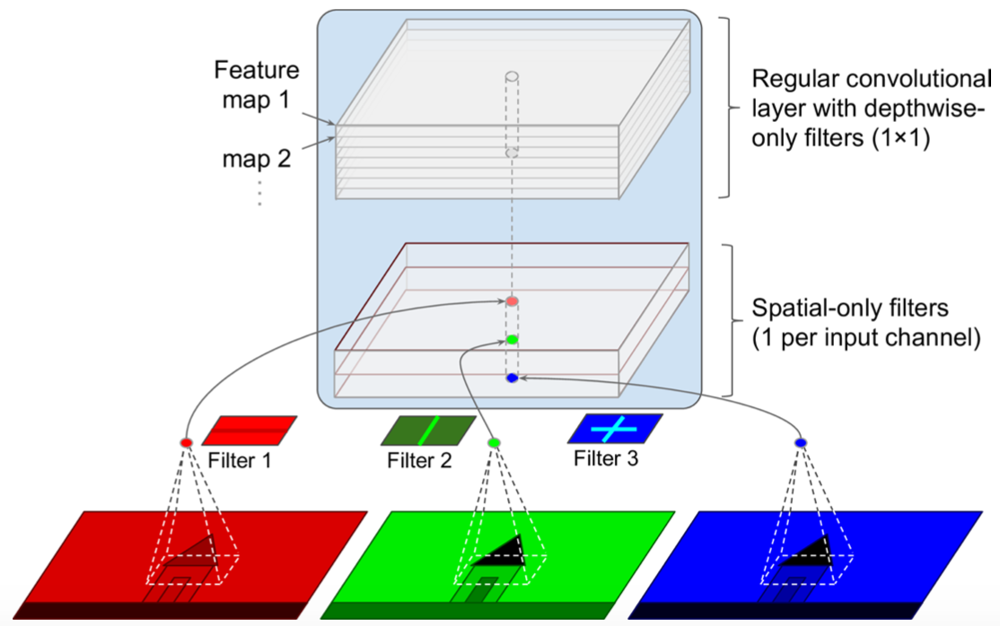  
  
  - Xception architecture starts with 2 regular convolutional layers, but then the rest of the architecture uses only separable convolutions (34 in all)  
  - plus a few max pooling layers and the usual final layers (a global average pooling layer and a dense output layer).  
  -

# SENet  
***  
2017 https://arxiv.org/abs/1709.01507
*** 
win the competition with an astonishing 2.25% top-five error rate  
 - SENet adds a small neural network, called an SE block, to every unit in the original architecture (i.e., every inception module or every residual unit)    
  - SE-Inception module (left) and `SE-ResNet unit` (right)
 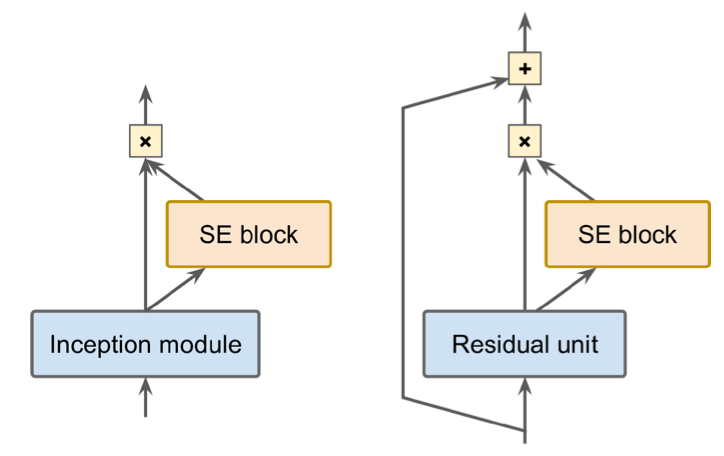

#### SE block  
analyzes the output of the unit it is attached to, focusing exclusively on the depth dimension (it does not look for any spatial pattern)  
 - uses this information to recalibrate the feature maps,   
 - An SE block performs feature map recalibration
 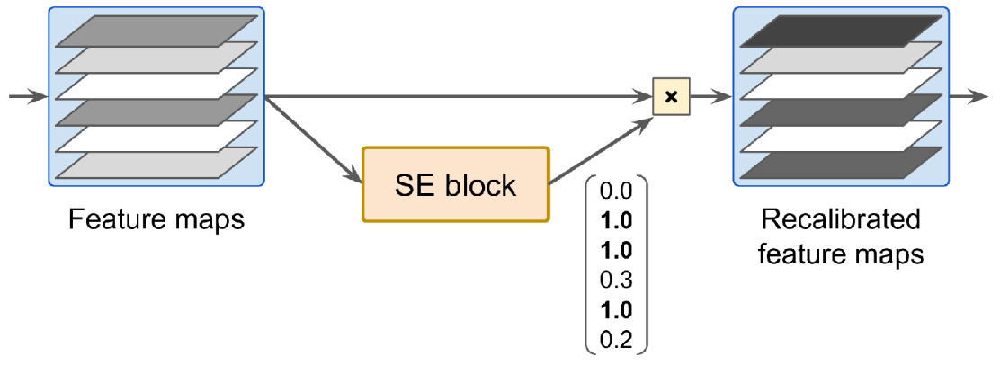    
 - For example, an SE block may learn that mouths, noses, and eyes usually appear together in pictures: if you see a mouth and a nose, you should expect to see eyes as well. 
 

#### SE block is composed of just three layers:  
 -  global average pooling layer, a hidden dense layer using the ReLU activation function, and a dense output layer using the sigmoid activation function   
 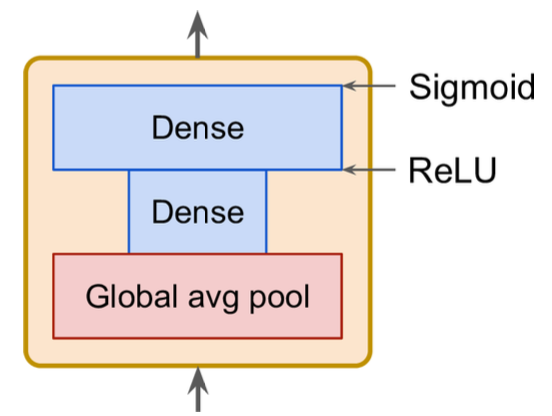

## Using a Pretrained Model  
***   
won’t have to implement standard models like GoogLeNet or ResNet manually  
<font color=pink>keras.applications</font>    
- ResNet variants, GoogLeNet variants like Inception-v3 and Xception, VGGNet variants, and MobileNet and MobileNetV2 (lightweight models for use in mobile applications).


In [37]:
# load the ResNet-50 model, pretrained on ImageNet
model = keras.applications.resnet50.ResNet50(weights="imagenet")

102973440/102967424 [==============================] - 7s 0us/step


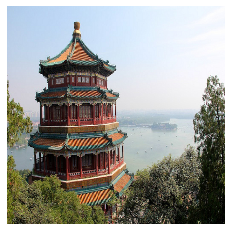

In [38]:
# ResNet-50 model expects 224 × 224-pixel images -> tf.image.resize()  
# to preserve the aspect ratio -> tf.image.crop_and_resize()
images_resized = tf.image.resize(images, [224, 224])
plot_color_image(images_resized[0])
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


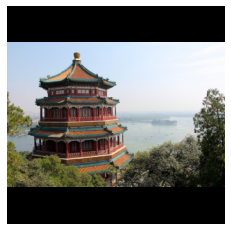

In [39]:
images_resized = tf.image.resize_with_pad(images, 224, 224, antialias=True)
plot_color_image(images_resized[0])

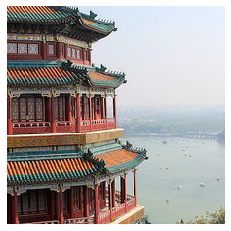

In [40]:
images_resized = tf.image.resize_with_crop_or_pad(images, 224, 224)
plot_color_image(images_resized[0])
plt.show()

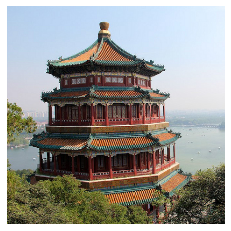

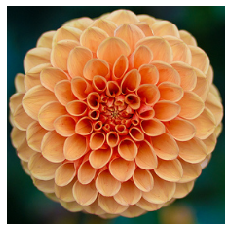

In [41]:
# to preserve the aspect ratio -> tf.image.crop_and_resize()
china_box = [0, 0.03, 1, 0.68]
flower_box = [0.19, 0.26, 0.86, 0.7]
images_resized = tf.image.crop_and_resize(images, [china_box, flower_box], [0, 1], [224, 224])
plot_color_image(images_resized[0])
plt.show()
plot_color_image(images_resized[1])
plt.show()

In [42]:
# pretrained models assume that the images are preprocessed in a specific way
# some cases they may expect the inputs to be scaled from 0 to 1, or –1 to 1
# preprocess_input()  
# assume that the pixel values range from 0 to 255, so we must multiply them by 255 
inputs = keras.applications.resnet50.preprocess_input(images_resized * 255)
Y_proba = model.predict(inputs)

In [43]:
Y_proba.shape

(2, 1000)

In [44]:
top_K = keras.applications.resnet50.decode_predictions(Y_proba, top=3)
for image_index in range(len(images)):
    print("Image #{}".format(image_index))
    for class_id, name, y_proba in top_K[image_index]:
        print("  {} - {:12s} {:.2f}%".format(class_id, name, y_proba * 100))
    print()

40960/35363 [==================================] - 0s 0us/step
Image #0
  n03877845 - palace       43.39%
  n02825657 - bell_cote    43.07%
  n03781244 - monastery    11.70%

Image #1
  n04522168 - vase         53.96%
  n07930864 - cup          9.52%
  n11939491 - daisy        4.97%



## Pretrained Models for Transfer Learning  
***  
reuse the lower layers of a pretrained model.  
 - classify pictures of flowers, reusing a pretrained `Xception model`.

In [53]:
import tensorflow_datasets as tfds

dataset, info = tfds.load("tf_flowers", as_supervised=True, with_info=True)

local data directory. If you'd instead prefer to read directly from our public
GCS bucket (recommended if you're running on GCP), you can instead pass
`try_gcs=True` to `tfds.load` or set `data_dir=gs://tfds-data/datasets`.





Dataset tf_flowers downloaded and prepared to /Users/j/tensorflow_datasets/tf_flowers/3.0.0. Subsequent calls will reuse this data.


In [54]:
info.splits

{'train': <tfds.core.SplitInfo num_examples=3670>}

In [55]:
info.splits["train"]

<tfds.core.SplitInfo num_examples=3670>

In [56]:
class_names = info.features["label"].names
class_names    # ["dandelion", "daisy", ...]

['dandelion', 'daisy', 'tulips', 'sunflowers', 'roses']

In [57]:
n_classes = info.features["label"].num_classes # 5

In [58]:
dataset_size = info.splits["train"].num_examples
dataset_size   # 3670

3670

**Warning:** TFDS's split API has evolved since the book was published. The [new split API](https://www.tensorflow.org/datasets/splits) (called S3) is much simpler to use:

In [59]:
test_set_raw, valid_set_raw, train_set_raw = tfds.load(
    "tf_flowers",
    split=["train[:10%]", "train[10%:25%]", "train[25%:]"],
    as_supervised=True)

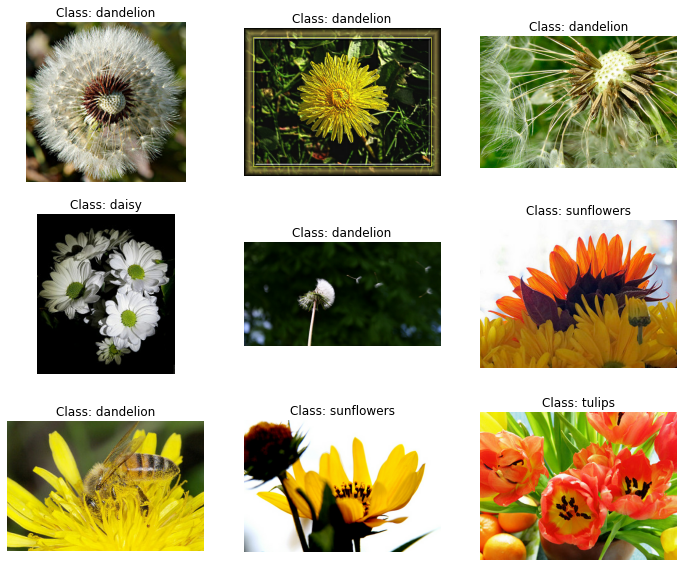

In [61]:
plt.figure(figsize=(12, 10))
index = 0
for image, label in train_set_raw.take(9):
    index += 1
    plt.subplot(3, 3, index)
    plt.imshow(image)
    plt.title("Class: {}".format(class_names[label]))
    plt.axis("off")

plt.show()

Basic preprocessing:

In [62]:
# CNN expects 224 × 224 images, so we need to resize them
def preprocess(image, label):
    resized_image = tf.image.resize(image, [224, 224])
    final_image = keras.applications.xception.preprocess_input(resized_image)
    return final_image, label

Slightly fancier preprocessing (but you could add much more data augmentation):

In [63]:
def central_crop(image):
    shape = tf.shape(image)
    min_dim = tf.reduce_min([shape[0], shape[1]])
    top_crop = (shape[0] - min_dim) // 4
    bottom_crop = shape[0] - top_crop
    left_crop = (shape[1] - min_dim) // 4
    right_crop = shape[1] - left_crop
    return image[top_crop:bottom_crop, left_crop:right_crop]

def random_crop(image):
    shape = tf.shape(image)
    min_dim = tf.reduce_min([shape[0], shape[1]]) * 90 // 100
    return tf.image.random_crop(image, [min_dim, min_dim, 3])

# If you want to perform some data augmentation, change the preprocessing function for 
# the training set, adding some random transformations to the training images.
def preprocess(image, label, randomize=False):
    if randomize:
        cropped_image = random_crop(image)    # randomly crop the images
        cropped_image = tf.image.random_flip_left_right(cropped_image)    # randomly flip the images horizontally,
    else:
        cropped_image = central_crop(image)
    resized_image = tf.image.resize(cropped_image, [224, 224])
    final_image = keras.applications.xception.preprocess_input(resized_image)
    return final_image, label

# apply this preprocessing function to all three datasets, shuffle the training set, 
# and add batching and prefetching to all the datasets
batch_size = 32
train_set = train_set_raw.shuffle(1000).repeat()
train_set = train_set.map(partial(preprocess, randomize=True)).batch(batch_size).prefetch(1)
valid_set = valid_set_raw.map(preprocess).batch(batch_size).prefetch(1)
test_set = test_set_raw.map(preprocess).batch(batch_size).prefetch(1)

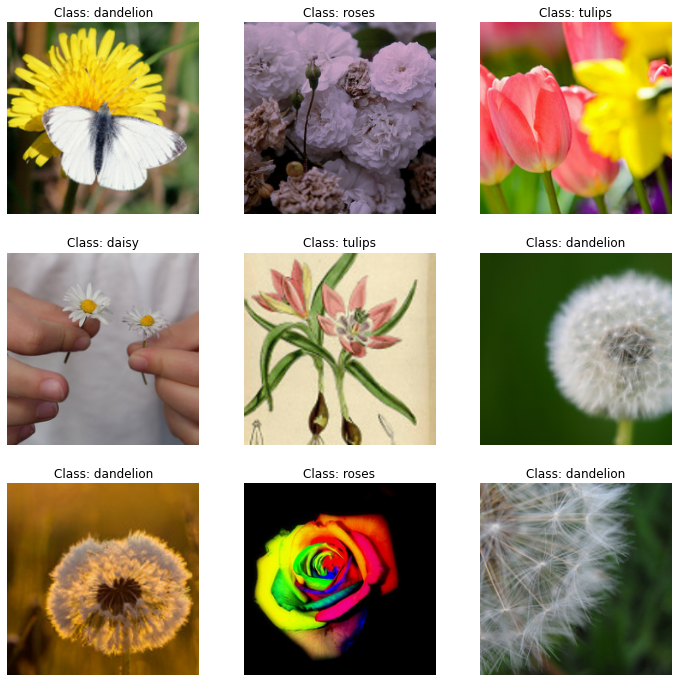

In [64]:
plt.figure(figsize=(12, 12))
for X_batch, y_batch in train_set.take(1):
    for index in range(9):
        plt.subplot(3, 3, index + 1)
        plt.imshow(X_batch[index] / 2 + 0.5)
        plt.title("Class: {}".format(class_names[y_batch[index]]))
        plt.axis("off")

plt.show()

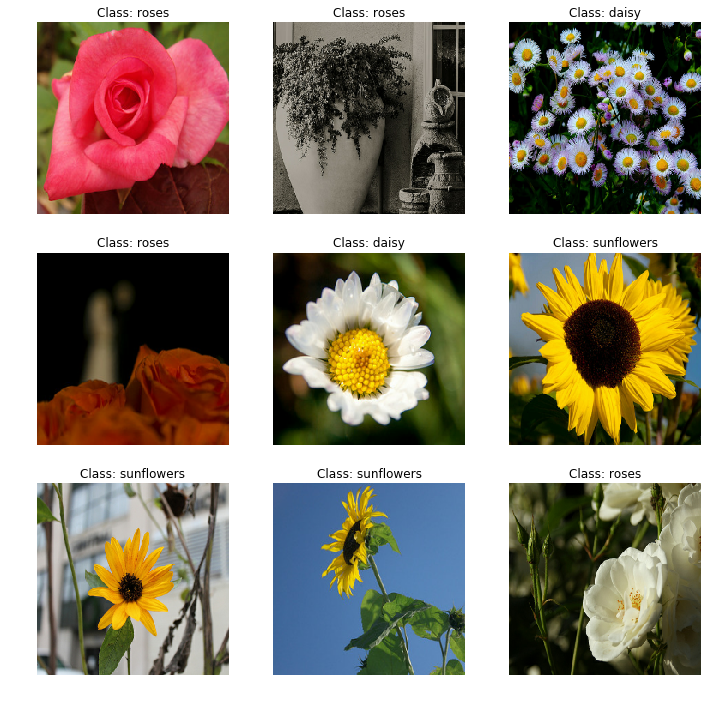

In [51]:
plt.figure(figsize=(12, 12))
for X_batch, y_batch in test_set.take(1):
    for index in range(9):
        plt.subplot(3, 3, index + 1)
        plt.imshow(X_batch[index] / 2 + 0.5)
        plt.title("Class: {}".format(class_names[y_batch[index]]))
        plt.axis("off")

plt.show()

In [65]:
# load an Xception model, pretrained on ImageNet
# exclude the top of the network by setting include_top=False
base_model = keras.applications.xception.Xception(weights="imagenet",
                                                  include_top=False)
avg = keras.layers.GlobalAveragePooling2D()(base_model.output)
output = keras.layers.Dense(n_classes, activation="softmax")(avg)
model = keras.models.Model(inputs=base_model.input, outputs=output)

83689472/83683744 [==============================] - 13s 0us/step


In [66]:
# usually a good idea to freeze the weights of the pre‐ trained layers, 
# at least at the beginning of training
for index, layer in enumerate(base_model.layers):
    print(index, layer.name)

0 input_2
1 block1_conv1
2 block1_conv1_bn
3 block1_conv1_act
4 block1_conv2
5 block1_conv2_bn
6 block1_conv2_act
7 block2_sepconv1
8 block2_sepconv1_bn
9 block2_sepconv2_act
10 block2_sepconv2
11 block2_sepconv2_bn
12 conv2d_44
13 block2_pool
14 batch_normalization_36
15 add
16 block3_sepconv1_act
17 block3_sepconv1
18 block3_sepconv1_bn
19 block3_sepconv2_act
20 block3_sepconv2
21 block3_sepconv2_bn
22 conv2d_45
23 block3_pool
24 batch_normalization_37
25 add_1
26 block4_sepconv1_act
27 block4_sepconv1
28 block4_sepconv1_bn
29 block4_sepconv2_act
30 block4_sepconv2
31 block4_sepconv2_bn
32 conv2d_46
33 block4_pool
34 batch_normalization_38
35 add_2
36 block5_sepconv1_act
37 block5_sepconv1
38 block5_sepconv1_bn
39 block5_sepconv2_act
40 block5_sepconv2
41 block5_sepconv2_bn
42 block5_sepconv3_act
43 block5_sepconv3
44 block5_sepconv3_bn
45 add_3
46 block6_sepconv1_act
47 block6_sepconv1
48 block6_sepconv1_bn
49 block6_sepconv2_act
50 block6_sepconv2
51 block6_sepconv2_bn
52 block6_se

In [67]:
# compile the model and start training:
# will be very slow, unless you have a GPU
for layer in base_model.layers:
    layer.trainable = False

optimizer = keras.optimizers.SGD(lr=0.2, momentum=0.9, decay=0.01)
model.compile(loss="sparse_categorical_crossentropy", optimizer=optimizer,
              metrics=["accuracy"])
history = model.fit(train_set,
                    steps_per_epoch=int(0.75 * dataset_size / batch_size),
                    validation_data=valid_set,
                    validation_steps=int(0.15 * dataset_size / batch_size),
                    epochs=5)

Epoch 1/5
86/86 [==============================] - 583s 7s/step - loss: 1.1906 - accuracy: 0.8020 - val_loss: 1.0249 - val_accuracy: 0.8217
Epoch 2/5
86/86 [==============================] - 554s 6s/step - loss: 0.4931 - accuracy: 0.8924 - val_loss: 0.9377 - val_accuracy: 0.8419
Epoch 3/5
86/86 [==============================] - 452s 5s/step - loss: 0.3188 - accuracy: 0.9230 - val_loss: 0.7998 - val_accuracy: 0.8621
Epoch 4/5
86/86 [==============================] - 480s 6s/step - loss: 0.2602 - accuracy: 0.9364 - val_loss: 0.7049 - val_accuracy: 0.8768
Epoch 5/5
86/86 [==============================] - 443s 5s/step - loss: 0.1813 - accuracy: 0.9473 - val_loss: 0.6432 - val_accuracy: 0.8713


 - so we are ready to unfreeze all the layers (or you could try unfreezing just the top ones) and continue training (don’t forget to compile the model when you freeze or unfreeze layers).   
 This time we use a much lower learning rate to avoid damaging the pretrained weights:

In [68]:
for layer in base_model.layers:
    layer.trainable = True

optimizer = keras.optimizers.SGD(learning_rate=0.01, momentum=0.9,
                                 nesterov=True, decay=0.001)
model.compile(loss="sparse_categorical_crossentropy", optimizer=optimizer,
              metrics=["accuracy"])
history = model.fit(train_set,
                    steps_per_epoch=int(0.75 * dataset_size / batch_size),
                    validation_data=valid_set,
                    validation_steps=int(0.15 * dataset_size / batch_size),
                    epochs=40)

Epoch 1/40
86/86 [==============================] - 3212s 37s/step - loss: 0.3414 - accuracy: 0.8892 - val_loss: 0.8489 - val_accuracy: 0.8051
Epoch 2/40
86/86 [==============================] - 5977s 69s/step - loss: 0.1321 - accuracy: 0.9564 - val_loss: 0.4105 - val_accuracy: 0.8676
Epoch 3/40
86/86 [==============================] - 8704s 101s/step - loss: 0.0663 - accuracy: 0.9760 - val_loss: 0.2460 - val_accuracy: 0.9191
Epoch 4/40
86/86 [==============================] - 1594s 19s/step - loss: 0.0499 - accuracy: 0.9833 - val_loss: 0.3017 - val_accuracy: 0.9210
Epoch 5/40
86/86 [==============================] - 1562s 18s/step - loss: 0.0426 - accuracy: 0.9855 - val_loss: 0.2704 - val_accuracy: 0.9173
Epoch 6/40
86/86 [==============================] - 1516s 18s/step - loss: 0.0236 - accuracy: 0.9924 - val_loss: 0.2744 - val_accuracy: 0.9210
Epoch 7/40
86/86 [==============================] - 1487s 17s/step - loss: 0.0284 - accuracy: 0.9927 - val_loss: 0.2991 - val_accuracy: 0.919

# Classification and Localization

But now we have a problem: the flowers dataset `does not have bounding boxes` around the flowers. So, we need to add them ourselves.   
#### costly parts of a Machine Learning project: getting the labels  
 - Open source image labeling tool like VGG Image Annotator, LabelImg, OpenLabeler, or ImgLab, or perhaps a commercial tool like LabelBox or Supervisely.   
 - You may also want to consider crowdsourcing platforms such as Amazon Mechanical Turk if you have a very large number of images to annotate.  
  
#### then need to create a dataset whose items will be batches of preprocessed images along with their class labels and their bounding boxes  
 - Each item should be a tuple of the form (images, (class_labels, bounding_boxes))  
  
####  Intersection over Union (IoU)  
 - `MSE` often works fairly well as a cost function to train the model, but it is not a great metric to evaluate how well the model can predict bounding boxes.  
 - <font color=pink>tf.keras.metrics.MeanIoU</font> class  
 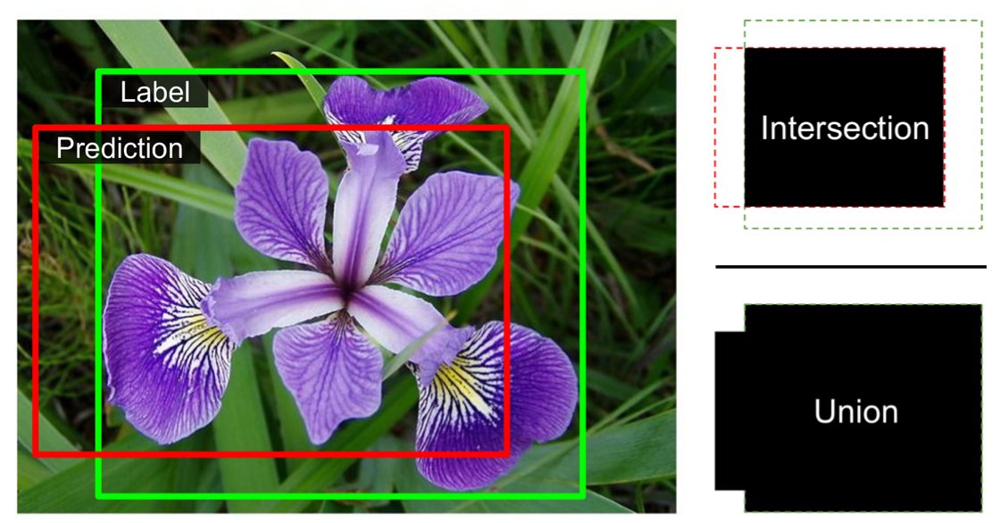  
 

In [70]:
base_model = keras.applications.xception.Xception(weights="imagenet",
                                                  include_top=False)
avg = keras.layers.GlobalAveragePooling2D()(base_model.output)
class_output = keras.layers.Dense(n_classes, activation="softmax")(avg)
loc_output = keras.layers.Dense(4)(avg)
model = keras.models.Model(inputs=base_model.input,
                           outputs=[class_output, loc_output])
model.compile(loss=["sparse_categorical_crossentropy", "mse"],
              loss_weights=[0.8, 0.2], # depends on what you care most about
              optimizer=optimizer, metrics=["accuracy"])

In [71]:
def add_random_bounding_boxes(images, labels):
    fake_bboxes = tf.random.uniform([tf.shape(images)[0], 4])
    return images, (labels, fake_bboxes)

fake_train_set = train_set.take(5).repeat(2).map(add_random_bounding_boxes)

In [72]:
model.fit(fake_train_set, steps_per_epoch=5, epochs=2)

Epoch 1/2
5/5 [==============================] - 73s 15s/step - loss: 1.4205 - dense_5_loss: 1.6649 - dense_6_loss: 0.4431 - dense_5_accuracy: 0.1937 - dense_6_accuracy: 0.2375
Epoch 2/2
5/5 [==============================] - 66s 13s/step - loss: 1.3376 - dense_5_loss: 1.5833 - dense_6_loss: 0.3547 - dense_5_accuracy: 0.3000 - dense_6_accuracy: 0.2438


# Object Detection  
***  
few years ago, a common approach was to take a CNN that was trained to classify and locate a single object, then slide it across the image   
Detecting multiple objects by sliding a CNN across the image  
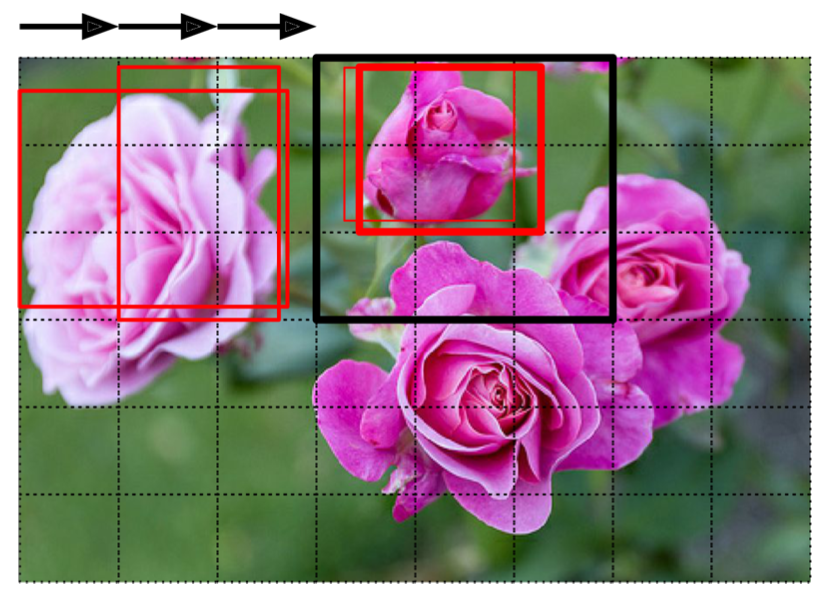  
  
- post-processing will then be needed to get rid of all the unnecessary bounding boxes. A common approach for this is called `non-max suppression`.   
 - First, you need to add an extra objectness output to your CNN, to estimate the probability that a flower is indeed present in the image
   - must use the sigmoid activation function, and you can train it using binary cross-entropy loss  
 - Find the bounding box with the highest objectness score, and get rid of all the other bounding boxes that overlap a lot with it  
 - Repeat step two until there are no more bounding boxes to get rid of.

#### fully convolutional network (FCN) 
much faster way to slide a CNN across an image:   
 - pointed out that you could`replace the dense layers` at the top of a CNN by `convolutional layers`.   
  - suppose a dense layer with 200 neurons sits on top of a convolu‐ tional layer that outputs 100 feature maps, each of size 7 × 7  
  - Each neuron will compute a weighted sum of all 100 × 7 × 7 activations from the convolutional layer (plus a bias term)  
  - Now let’s see what happens if we replace the dense layer with a convolutional layer using 200 filters  
   - it will output 200 numbers, just like the dense layer did  
   - only difference is that the dense layer’s output was a tensor of shape `[batch size, 200]`, while the convolutional layer will output a tensor of shape `[batch size, 1, 1, 200]`.  
     
To convert a dense layer to a convolutional layer  
 - `number of filters` in the convolutional layer must be equal to the `number of units` in the dense layer  
 - `filter size` must be equal to the size of the input feature maps, and you must use `"valid" padding`. The `stride` may be set to 1 or more,

# You Only Look Once (YOLO)  
*** 
read all 3  
2015 https://arxiv.org/abs/1506.02640   
2016 https://arxiv.org/abs/1612.08242  
2018 https://arxiv.org/abs/1804.02767  
https://github.com/zzh8829/yolov3-tf2
***  
fast and accurate object detection architecture  
 - It outputs `five bounding boxes` for each grid cell (instead of just one)  
  - each bounding box comes with an objectness score.  
  - also outputs `20 class probabilities` per grid cell  
  - `45 numbers per grid cell`: 5 bounding boxes, each with 4 coordinates, plus 5 objectness scores, plus 20 class probabilities.  
 <br>  
 - Instead of predicting the absolute coordinates of the bounding box centers, YOLOv3 `predicts an offset relative to the coordinates of the grid cell`, where (0, 0) means the top left of that cell and (1, 1) means the bottom right.  
  - applies the logistic activation function to the bounding box coordinates to ensure they remain in the 0 to 1 range.  
<br>  
 - YOLOv3 finds five representative bounding box dimensions, called `anchor boxes` (or `bounding box priors`). 
  -  does this by applying the K-Means algorithm to the height and width of the training set bounding boxes.  
  -  
<br>  
 - The network is trained using images of different scales.  
  -  every few batches during training, the network randomly chooses a new image dimension, allows the network to learn to detect objects at different scales . 
  - smaller scale will be less accurate but faster than the larger scale.

# Mean Average Precision (mAP)   
***
common metric used in object detection tasks   
 - one of the motivations for the mAP me : precision/recall curve may contain a few sections where precision actually goes up when recall increases, especially at low recall values  
#### Average Precision (AP) metric  
compute the maximum precision you can get with at least 0% recall, then 10% recall, 20%, and so on up to 100%, and then calculate the mean of these maximum precisions.  
<br>  

In an object detection system, there is an additional level of complexity:  
 - what if the system detected the correct class, but at the wrong location   
  - One approach is to define an IOU threshold:

In [73]:
def maximum_precisions(precisions):
    return np.flip(np.maximum.accumulate(np.flip(precisions)))

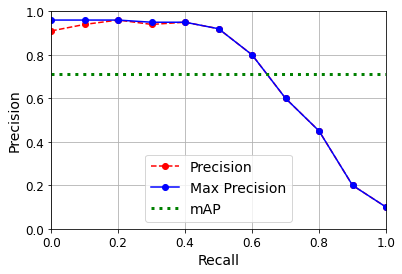

In [74]:
recalls = np.linspace(0, 1, 11)

precisions = [0.91, 0.94, 0.96, 0.94, 0.95, 0.92, 0.80, 0.60, 0.45, 0.20, 0.10]
max_precisions = maximum_precisions(precisions)
mAP = max_precisions.mean()
plt.plot(recalls, precisions, "ro--", label="Precision")
plt.plot(recalls, max_precisions, "bo-", label="Max Precision")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.plot([0, 1], [mAP, mAP], "g:", linewidth=3, label="mAP")
plt.grid(True)
plt.axis([0, 1, 0, 1])
plt.legend(loc="lower center", fontsize=14)
plt.show()

#### SSD. 

https://arxiv.org/abs/1512.02325  
***  
#### Faster- RCNN  
  
https://arxiv.org/abs/1506.01497  
***  

Let’s see how to go down to the pixel level.
# Semantic Segmentation  
***  
 - each pixel is classified according to the class of the object it belongs to  
  - different objects of the same class are not distinguished  
 - images go through a regular CNN, they gradually lose their spatial resolution (due to the layers with strides greater than 1)  
  - person somewhere in the bottom left of the image, but it will not be much more precise than that.  
  
<br>  
  - taking a pretrained CNN and turning it into an FCN.  
   - CNN applies an overall stride of 32 to the input image, meaning the last layer outputs feature maps that are `32 times smaller than the input image`
   - so they add a single `upsampling layer` that multiplies the resolution by 32.  
     - `bilinear interpolation` : only works reasonably well up to ×4 or ×8    
     - `transposed convolutional layer` : equivalent to first stretching the image by inserting empty rows and columns (full of zeros), then performing a regular convolution.  
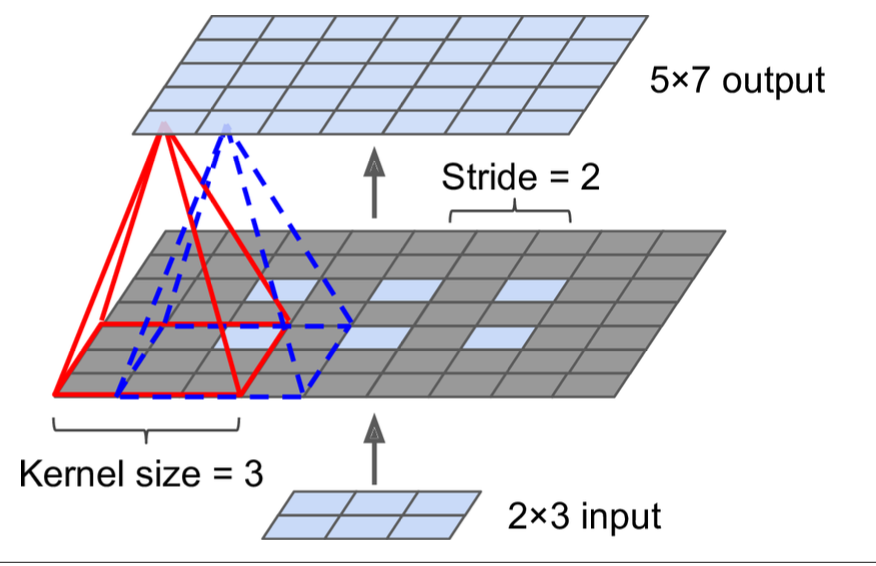
  
 - In <font color=pink>tf.keras</font>, you can use the <font color=pink>Conv2DTranspose</font>layer.

This solution is OK, but still too imprecise.   
#### Transpose convolutions:  
In a transposed convolutional layer  
 - stride defines how much the `input will be stretched`, not the size of the filter steps,   
 - so the `larger the stride`, the `larger the output` (unlike for convolutional layers or pooling layers).  
 
#### keras.layers.Conv1D  
 - Creates a convolutional layer for 1D inputs, such as time series or text (sequences of letters or words)  

#### keras.layers.Conv3D  
 - Creates a convolutional layer for 3D inputs, such as 3D PET scans.  

#### dilation_rate   
 - Setting hyperparameter of any convolutional layer to a value of 2 or more creates an `à-trous(with holes) convolutional layer`  
 - For example, a 1 × 3 filter equal to [[1,2,3]] may be dilated with a dilation rate of 4, resulting in a dilated filter of [[1, 0, 0, 0, 2, 0, 0, 0, 3]]  
 -  lets the convolutional layer have a larger receptive field at no computational price and using no extra parameters  
 
#### tf.nn.depthwise_conv2d()  
 - Can be used to create a depthwise convolutional layer(need to create the variables yourself)  
 - fn filters and fn′ input channels, then this will output fn × fn′ feature maps.


 #### skip connections from lower layers:  
  1. upsampled the output image by a factor of 2 (instead of 32)  
  2. and they added the output of a lower layer that had this double resolution  
  3. Then they upsampled the result by a factor of 16, leading to a total upsam‐ pling factor of 32  
  
 - This recovered some of the spatial resolution that was lost in earlier pooling layers.  
 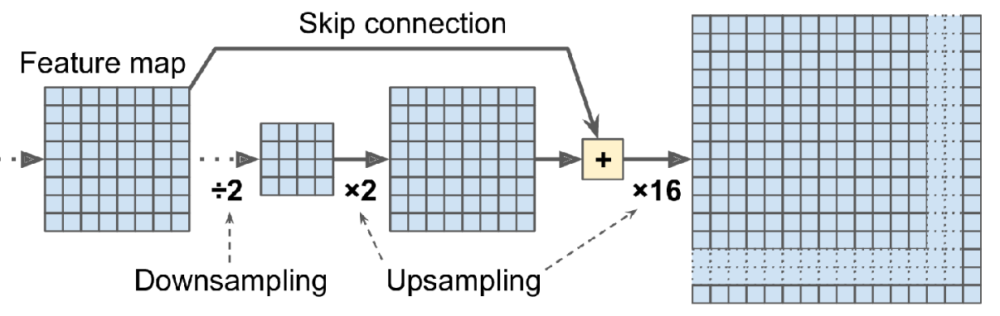

<br>  
 - they used a second similar skip connection to recover even finer details from an even lower layer.  
  -  the output of the original CNN goes through the following extra steps:    
    1. upscale ×2,   
    2. add the output of a lower layer (of the appropriate scale),   
    3. upscale ×2,   
    4. add the output of an even lower layer,   
    5. and finally upscale ×8.  
  
 even possible to scale up beyond the size of the original image: this can be used to increase the resolution of an image, which is a technique called super-resolution.  


#### extends the Faster R-CNN model by additionally producing a pixel mask for each bounding box   
***
2017 https://arxiv.org/abs/1703.06870  
***  
 - not only do you get a bounding box around each object, with a set of estimated class probabilities,   
 - but you also get a pixel mask that locates pixels in the bounding box that belong to the object  
 
#### adversarial learning   
 - attempts to make the network more resistant to images designed to fool it  

#### realistic image generation  
  
#### single-shot learning  
 - system that can recognize an object after it has seen it just once  

#### novel  capsule networks  
   https://homl.info/capsnet  
   https://www.youtube.com/watch?v=pPN8d0E3900&list=PLuTYjXW7aAt3HLCATBOkkXtifCVAm0O_A

In [75]:
tf.random.set_seed(42)
X = images_resized.numpy()

conv_transpose = keras.layers.Conv2DTranspose(filters=5, kernel_size=3, strides=2, padding="VALID")
output = conv_transpose(X)
output.shape

TensorShape([2, 449, 449, 5])

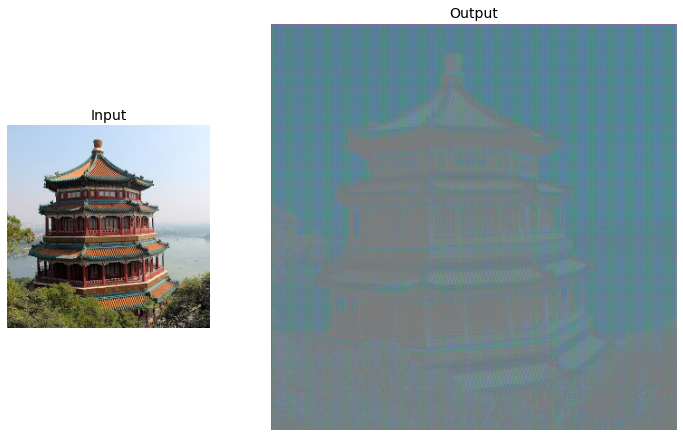

In [76]:
def normalize(X):
    return (X - tf.reduce_min(X)) / (tf.reduce_max(X) - tf.reduce_min(X))

fig = plt.figure(figsize=(12, 8))
gs = mpl.gridspec.GridSpec(nrows=1, ncols=2, width_ratios=[1, 2])

ax1 = fig.add_subplot(gs[0, 0])
ax1.set_title("Input", fontsize=14)
ax1.imshow(X[0])  # plot the 1st image
ax1.axis("off")
ax2 = fig.add_subplot(gs[0, 1])
ax2.set_title("Output", fontsize=14)
ax2.imshow(normalize(output[0, ..., :3]), interpolation="bicubic")  # plot the output for the 1st image
ax2.axis("off")
plt.show()

In [77]:
def upscale_images(images, stride, kernel_size):
    batch_size, height, width, channels = images.shape
    upscaled = np.zeros((batch_size,
                         (height - 1) * stride + 2 * kernel_size - 1,
                         (width - 1) * stride + 2 * kernel_size - 1,
                         channels))
    upscaled[:,
             kernel_size - 1:(height - 1) * stride + kernel_size:stride,
             kernel_size - 1:(width - 1) * stride + kernel_size:stride,
             :] = images
    return upscaled

In [78]:
upscaled = upscale_images(X, stride=2, kernel_size=3)
weights, biases = conv_transpose.weights
reversed_filters = np.flip(weights.numpy(), axis=[0, 1])
reversed_filters = np.transpose(reversed_filters, [0, 1, 3, 2])
manual_output = tf.nn.conv2d(upscaled, reversed_filters, strides=1, padding="VALID")

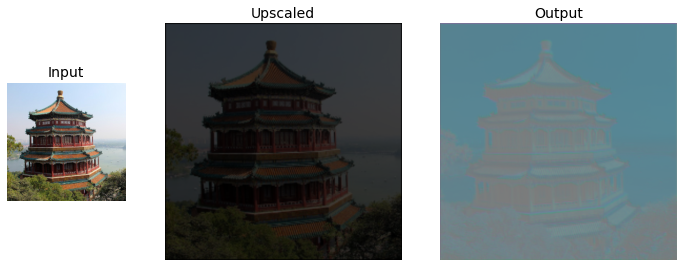

In [79]:
def normalize(X):
    return (X - tf.reduce_min(X)) / (tf.reduce_max(X) - tf.reduce_min(X))

fig = plt.figure(figsize=(12, 8))
gs = mpl.gridspec.GridSpec(nrows=1, ncols=3, width_ratios=[1, 2, 2])

ax1 = fig.add_subplot(gs[0, 0])
ax1.set_title("Input", fontsize=14)
ax1.imshow(X[0])  # plot the 1st image
ax1.axis("off")
ax2 = fig.add_subplot(gs[0, 1])
ax2.set_title("Upscaled", fontsize=14)
ax2.imshow(upscaled[0], interpolation="bicubic")
ax2.axis("off")
ax3 = fig.add_subplot(gs[0, 2])
ax3.set_title("Output", fontsize=14)
ax3.imshow(normalize(manual_output[0, ..., :3]), interpolation="bicubic")  # plot the output for the 1st image
ax3.axis("off")
plt.show()

In [80]:
np.allclose(output, manual_output.numpy(), atol=1e-7)

True

# Exercises

## 1. to 8.

See appendix A.

## 9. High Accuracy CNN for MNIST
_Exercise: Build your own CNN from scratch and try to achieve the highest possible accuracy on MNIST._

The following model uses 2 convolutional layers, followed by 1 pooling layer, then dropout 25%, then a dense layer, another dropout layer but with 50% dropout, and finally the output layer. It reaches about 99.2% accuracy on the test set. This places this model roughly in the top 20% in the [MNIST Kaggle competition](https://www.kaggle.com/c/digit-recognizer/) (if we ignore the models with an accuracy greater than 99.79% which were most likely trained on the test set, as explained by Chris Deotte in [this post](https://www.kaggle.com/c/digit-recognizer/discussion/61480)). Can you do better? To reach 99.5 to 99.7% accuracy on the test set, you need to add image augmentation, batch norm, use a learning schedule such as 1-cycle, and possibly create an ensemble.

In [67]:
(X_train_full, y_train_full), (X_test, y_test) = keras.datasets.mnist.load_data()
X_train_full = X_train_full / 255.
X_test = X_test / 255.
X_train, X_valid = X_train_full[:-5000], X_train_full[-5000:]
y_train, y_valid = y_train_full[:-5000], y_train_full[-5000:]

X_train = X_train[..., np.newaxis]
X_valid = X_valid[..., np.newaxis]
X_test = X_test[..., np.newaxis]

In [68]:
keras.backend.clear_session()
tf.random.set_seed(42)
np.random.seed(42)

model = keras.models.Sequential([
    keras.layers.Conv2D(32, kernel_size=3, padding="same", activation="relu"),
    keras.layers.Conv2D(64, kernel_size=3, padding="same", activation="relu"),
    keras.layers.MaxPool2D(),
    keras.layers.Flatten(),
    keras.layers.Dropout(0.25),
    keras.layers.Dense(128, activation="relu"),
    keras.layers.Dropout(0.5),
    keras.layers.Dense(10, activation="softmax")
])
model.compile(loss="sparse_categorical_crossentropy", optimizer="nadam",
              metrics=["accuracy"])

model.fit(X_train, y_train, epochs=10, validation_data=(X_valid, y_valid))
model.evaluate(X_test, y_test)

Train on 55000 samples, validate on 5000 samples
Epoch 1/10
55000/55000 [==============================] - 102s 2ms/sample - loss: 0.1887 - accuracy: 0.9417 - val_loss: 0.0502 - val_accuracy: 0.9864
Epoch 2/10
55000/55000 [==============================] - 99s 2ms/sample - loss: 0.0815 - accuracy: 0.9754 - val_loss: 0.0414 - val_accuracy: 0.9904
Epoch 3/10
55000/55000 [==============================] - 103s 2ms/sample - loss: 0.0612 - accuracy: 0.9810 - val_loss: 0.0367 - val_accuracy: 0.9896
Epoch 4/10
55000/55000 [==============================] - 100s 2ms/sample - loss: 0.0496 - accuracy: 0.9846 - val_loss: 0.0376 - val_accuracy: 0.9900
Epoch 5/10
55000/55000 [==============================] - 104s 2ms/sample - loss: 0.0405 - accuracy: 0.9876 - val_loss: 0.0363 - val_accuracy: 0.9916
Epoch 6/10
55000/55000 [==============================] - 99s 2ms/sample - loss: 0.0368 - accuracy: 0.9882 - val_loss: 0.0352 - val_accuracy: 0.9924
Epoch 7/10
55000/55000 [=============================

[0.027682604857745575, 0.992]

## 10.  Use transfer learning for large image classification

_Exercise: Use transfer learning for large image classification, going through these steps:_

* _Create a training set containing at least 100 images per class. For example, you could classify your own pictures based on the location (beach, mountain, city, etc.), or alternatively you can use an existing dataset (e.g., from TensorFlow Datasets)._
* _Split it into a training set, a validation set, and a test set._
* _Build the input pipeline, including the appropriate preprocessing operations, and optionally add data augmentation._
* _Fine-tune a pretrained model on this dataset._

See the Flowers example above.

## 11.
_Exercise: Go through TensorFlow's [Style Transfer tutorial](https://homl.info/styletuto). It is a fun way to generate art using Deep Learning._


Simply open the Colab and follow its instructions.